In [1]:
import os

from tqdm import tqdm

import itertools
import warnings
warnings.filterwarnings('ignore')

from matplotlib import gridspec
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
from matplotlib import cm
import matplotlib.ticker as mtick
from matplotlib.ticker import MaxNLocator
import matplotlib.patches as patches

import datetime
from scipy import stats
from scipy.stats import pearsonr
import statsmodels.api as sm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# data_path = '/Users/reneprincipe/Library/CloudStorage/GoogleDrive-rlprincipe@up.edu.ph/My Drive/Research - PhD/Results/Resettlements/Resettlement Black Marble NTL Values/' 
data_path = '../Results/Resettlements/Black Marble/' 

In [3]:
def plot_in_log():
    plt.yscale('log')
    plt.xscale('log')

In [4]:
start_date, end_date = "2012-01-19", "2024-01-27"
date_range = pd.date_range(start=start_date, end=end_date, freq='D')

In [10]:
files = [f for f in os.listdir(data_path) if not f.startswith('.')]
files.sort()
files

['NTL_Provincial.csv',
 'NTL_Resettlement_Sites_0.csv',
 'NTL_Resettlement_Sites_1.csv',
 'NTL_Resettlement_Sites_2.csv',
 'NTL_Resettlement_Sites_3.csv',
 'NTL_Resettlement_Sites_4.csv',
 'NTL_Resettlement_Sites_5.csv']

# Test Plots

In [382]:
NTL_data = pd.read_csv(data_path+files[1], parse_dates=True, index_col = 0)*10#.reset_index(drop=True)*10
NTL_data.astype(float)

,Maya Park,Lanao Unity Park,Daanbantayan 3,Daanbantayan 4,Daanbantayan Site 1,Daanbantayan Site 2,Olivo Heights,Northview Park,Northview Park 2,Lawis Residences,...,Carigara Housing Project 1,Ecoville,Vergabriel's Heights,Mayorga Towne Homes,Paglaum Ville,Mont Eagle Ville IV,Tolosa Haiyan Village,Matlang Heights,Coconut Grove,Bagong Pag-Asa
2012-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-24,18.637931,2.035714,2.208333,0.0,7.000000,0.000000,0.000000,0.000000,0.000000,8.719577,...,16.0,5.489796,5.793893,0.0,3.0,0.000000,7.480916,15.341969,0.0,8.424138
2024-01-25,19.293103,21.130952,4.435185,6.0,3.000000,16.521739,4.296296,5.182857,2.956522,7.000000,...,13.0,10.061224,2.320611,2.0,3.0,1.574219,5.076336,27.575130,3.0,9.724138
2024-01-26,19.293103,21.130952,4.435185,6.0,3.000000,16.521739,4.296296,5.182857,2.956522,7.000000,...,13.0,10.061224,2.320611,2.0,3.0,1.574219,5.076336,27.575130,3.0,9.724138
2024-01-27,30.448276,7.952381,8.851852,11.0,11.168675,4.123188,4.296296,5.182857,4.217391,10.211640,...,13.0,10.061224,2.320611,2.0,3.0,5.128906,5.076336,14.611399,3.0,9.724138


## formatter functions

In [383]:
def format_dates():
    dtFmt = mdates.DateFormatter("%b-%Y") # define the formatting
    ax.xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
    plt.gcf().autofmt_xdate
    
def show_legend():    
    ax.set_ylabel('NTL Radiance, $nW·cm^{−2}·sr^{−1}$')
    ax.grid(alpha = 0.4)
    plt.legend(fontsize=10, ncol = 3, bbox_to_anchor= (0, 1.05, 1, 0.5), loc="lower left",
                    bbox_transform=plt.gca().transAxes, fancybox = True, mode='expand')

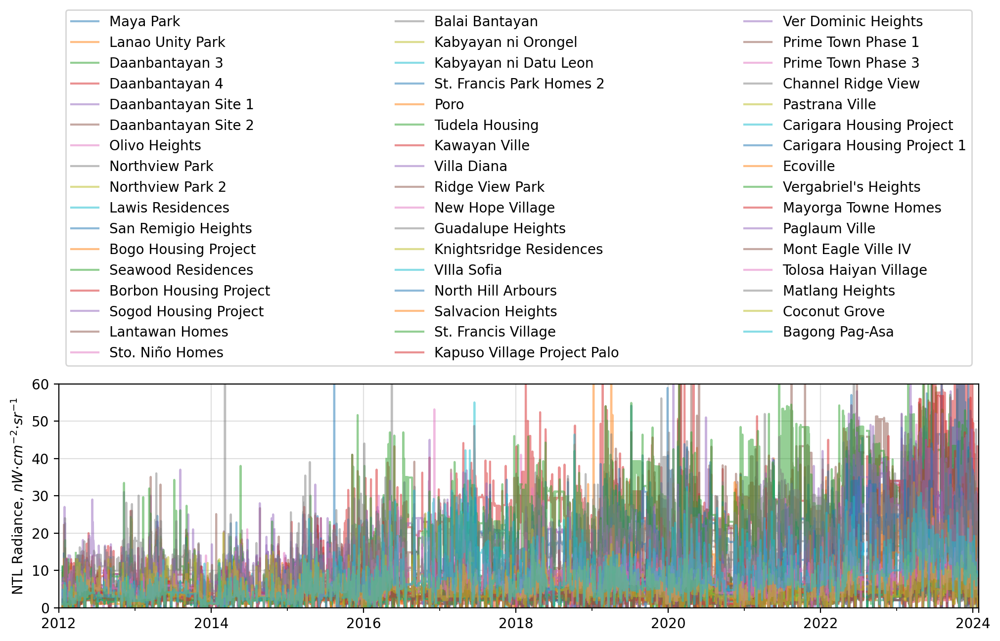

In [13]:
fig, ax = plt.subplots(dpi = 200, figsize = (12,3))
fig.patch.set_facecolor('None')

NTL_data.plot(ax=ax, alpha = 0.5)
show_legend()
plt.ylim(0,60)
plt.show()

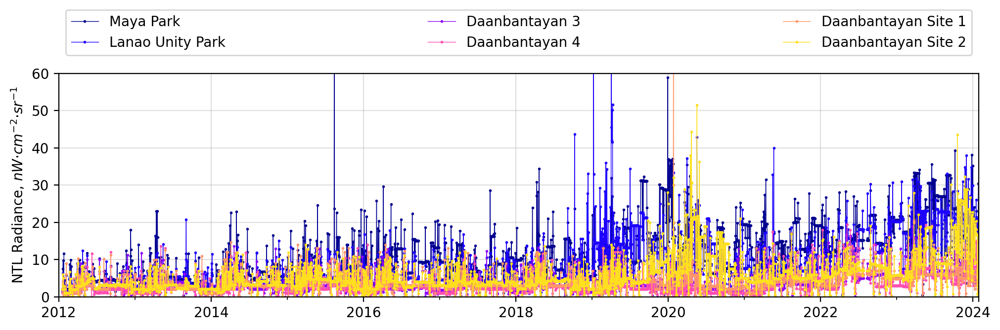

In [14]:
NTL_test = NTL_data[NTL_data.columns[:6]]
palette = sns.color_palette('gnuplot2', len(NTL_test.columns))


fig, ax = plt.subplots(dpi = 200, figsize = (12,3))
fig.patch.set_facecolor('None')

NTL_test.plot(ax=ax, marker='o', markersize=1, linestyle='-', linewidth=0.5, color = palette)
ax.set_ylabel('NTL Radiance, $nW·cm^{−2}·sr^{−1}$')
show_legend()
plt.ylim(0,60)
plt.show()

## quantile filtering

In [15]:
def outlier_removal(dataframe):
    q_low = dataframe.quantile(0.05)
    q_hi  = dataframe.quantile(0.95)
    dataframe = dataframe[(dataframe < q_hi) & (dataframe > q_low)]
    return dataframe

cleaned = outlier_removal(NTL_test)

## interpolating NAN values

In [16]:
NTL_test_processed = cleaned.interpolate(method='linear', limit_direction='both')
NTL_test_processed

,Maya Park,Lanao Unity Park,Daanbantayan 3,Daanbantayan 4,Daanbantayan Site 1,Daanbantayan Site 2
2012-01-01,7.505747,6.313492,1.226852,1.0,2.0,1.876812
2012-01-02,7.505747,6.313492,1.226852,1.0,2.0,1.876812
2012-01-03,7.505747,6.313492,1.226852,1.0,2.0,1.876812
2012-01-04,7.505747,6.313492,1.226852,1.0,2.0,1.876812
2012-01-05,7.505747,6.313492,1.226852,1.0,2.0,1.876812
...,...,...,...,...,...,...
2024-01-24,18.637931,2.035714,2.208333,6.0,7.0,5.109601
2024-01-25,19.293103,21.130952,4.435185,6.0,3.0,4.780797
2024-01-26,19.293103,21.130952,4.435185,6.0,3.0,4.451993
2024-01-27,19.293103,7.952381,4.435185,6.0,3.0,4.123188


# Visualizing NTL data

In [17]:
def visualize_ts(dataframe):
    fig, ax = plt.subplots(dpi = 200, figsize = (12,4))
    fig.patch.set_facecolor('None')
    
    palette = sns.color_palette('gnuplot2', len(dataframe.columns))

    dataframe.plot(ax=ax, marker='o', markersize=1, linestyle='-', linewidth=0.5, color = palette)
    ax.set_ylabel('NTL Radiance, $nW·cm^{−2}·sr^{−1}$')
    ax.grid(alpha = 0.4)
    plt.legend(fontsize=8, ncol = 3, bbox_to_anchor= (0, .85, 0.5, 0.5), loc="lower left",
                    bbox_transform=plt.gca().transAxes, fancybox = True, mode='expand')

    plt.ylim(0,30)
#     plt.show()

Text(0.5, 1.0, 'Preprocessed Black Marble NTL')

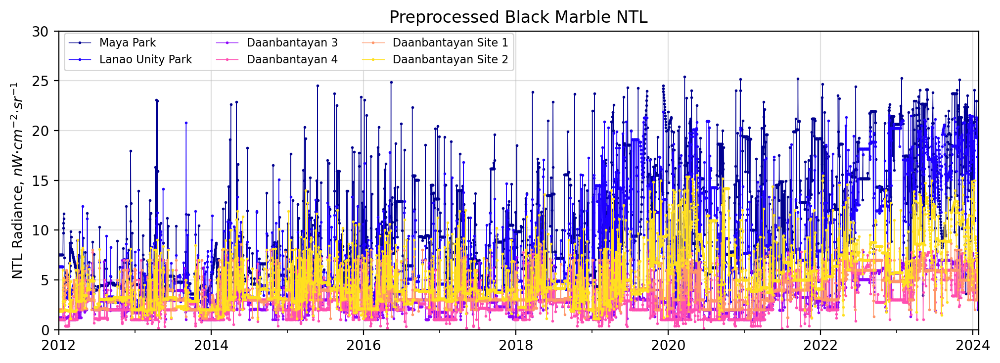

In [18]:
visualize_ts(NTL_test_processed)
plt.title("Preprocessed Black Marble NTL")

## moving average

Text(0.5, 1.0, 'Moving Average (365 days)')

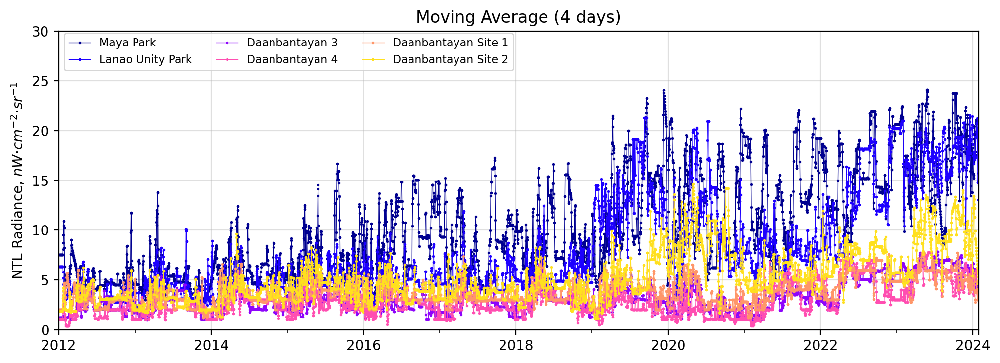

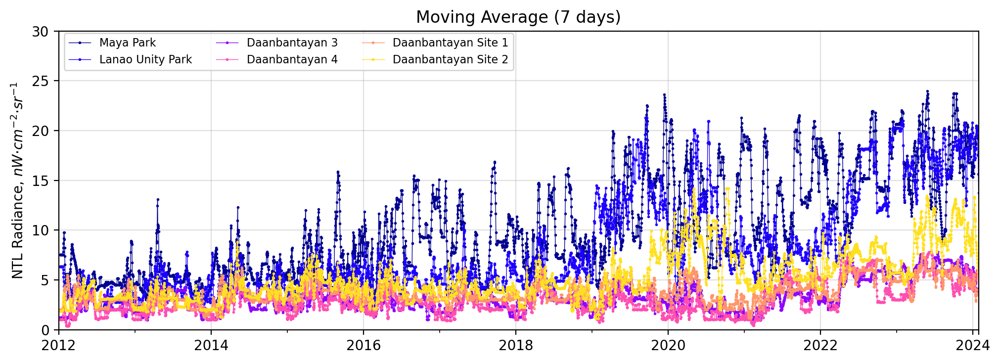

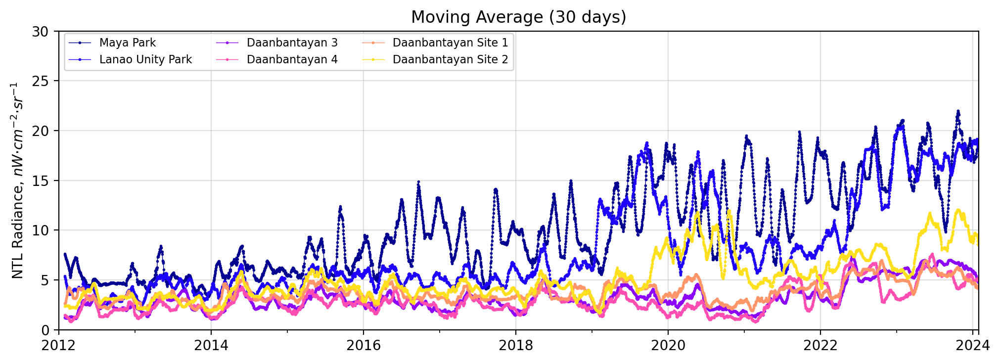

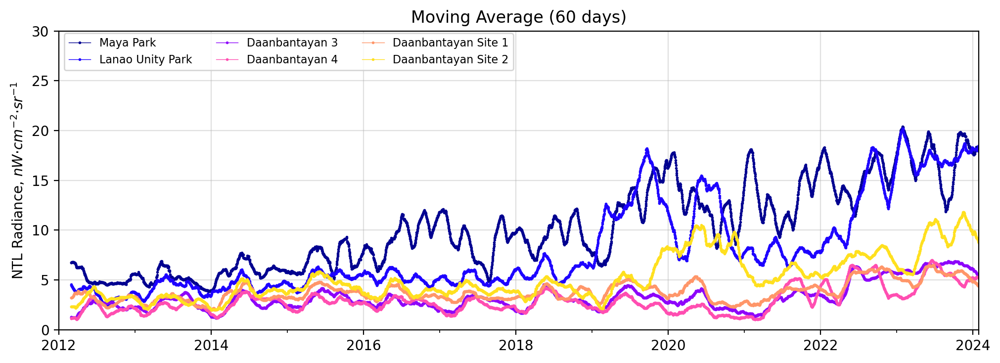

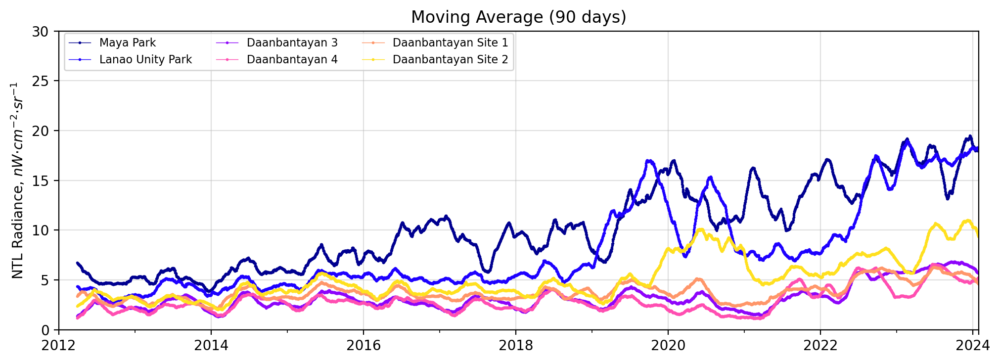

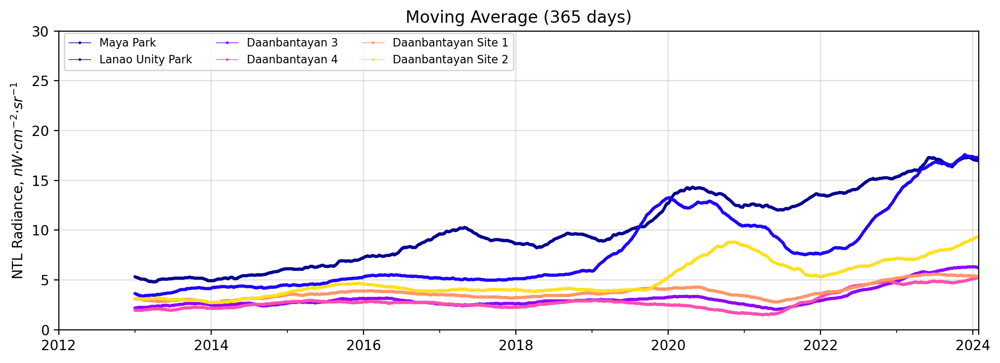

In [19]:
visualize_ts(NTL_test_processed.rolling(4).mean())
plt.title("Moving Average (4 days)")
visualize_ts(NTL_test_processed.rolling(7).mean())
plt.title("Moving Average (7 days)")
visualize_ts(NTL_test_processed.rolling(30).mean())
plt.title("Moving Average (30 days)")
visualize_ts(NTL_test_processed.rolling(60).mean())
plt.title("Moving Average (60 days)")
visualize_ts(NTL_test_processed.rolling(90).mean())
plt.title("Moving Average (90 days)")
visualize_ts(NTL_test_processed.rolling(365).mean())
plt.title("Moving Average (365 days)")

# Loading Resettlement Database

In [5]:
path = '/Users/reneprincipe/Library/CloudStorage/GoogleDrive-rlprincipe@up.edu.ph/My Drive/Research - PhD/Results/'

In [6]:
df = pd.read_excel(path + 'Philippine Resettlement Sites Database - RPrincipe et al. (2023).xlsx')

df['Latitude'] = pd.to_numeric(df['Latitude'], errors='coerce')
df['Longitude'] = pd.to_numeric(df['Longitude'], errors='coerce')
df['Buffer'] = pd.to_numeric(df['Buffer'], errors='coerce')
df = df[df['Buffer'].notna()].reset_index()
df_resettlement = df.copy()
# df_resettlement_ = df_resettlement
# df_resettlement['Title'].dropna()
df_resettlement

,index,Calamity,Project Name,Location,Classification,Latitude,Longitude,Buffer,Title,Map URL,Remarks,External Links,External Links.1,Typhoon,Province,Group
0,0,Typhoon Yolanda (2013),Maya Park Homes,"Brgy. Maya, Daanbantayan, Cebu",Identified,11.271009,124.048967,230.0,Maya Park,https://goo.gl/maps/3L3eRoigGDpjMxHT8,NaN,NaN,https://newsinfo.inquirer.net/944060/poor-nha-...,Yolanda,Cebu,Cebu
1,1,Typhoon Yolanda (2013),Lanao Unity Park Homes,"Brgy. Lanao, Daanbantayan, Cebu",Identified,11.248469,124.022224,280.0,Lanao Unity Park,https://goo.gl/maps/5SZCHBveYJqorcZ87,NaN,https://daanbantayan.gov.ph/2022/04/04/lanao-u...,NaN,Yolanda,Cebu,Cebu
2,2,Typhoon Yolanda (2013),Green Heights 1 (Daanbantayan 3),"Brgy. Tominjao, Daanbantayan, Cebu",Probable,11.221464,124.036788,260.0,Daanbantayan 3,https://goo.gl/maps/gjzeHfJ73dMTdiuX8,NaN,NaN,NaN,Yolanda,Cebu,Cebu
3,3,Typhoon Yolanda (2013),Green Heights 2 (Daanbantayan 4),"Brgy. Tominjao, Daanbantayan, Cebu",Identified,11.173075,124.015380,160.0,Daanbantayan 4,https://goo.gl/maps/1PfPDyVLY4bHvp78A,Adress was wrong on the NHA list. Turn-over da...,https://www.facebook.com/photo/?fbid=165837642...,NaN,Yolanda,Cebu,Cebu
4,4,Typhoon Yolanda (2013),Kandaya Homes 1 (Daanbantayan Site 1),"Brgy. Tapilon, Daanbantayan Site 1, Cebu",Identified,11.260164,124.036611,160.0,Daanbantayan Site 1,https://goo.gl/maps/2esB7Pmhx5NuNjYYA,Sites were raffled off to beneficiaries. Shape...,https://www.facebook.com/DaanbantayanLGU/photo...,https://www.facebook.com/DaanbantayanLGU/photo...,Yolanda,Cebu,Cebu
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260,443,Typhoon Pepeng (2009),Tuba Resettlement Proj.,"Tuba, Benguet",Probable,14.604640,121.260761,450.0,Tuba Res,Google Maps Link,NaN,NaN,NaN,Pepeng,Benguet,Luzon
261,461,Typhoon Yolanda (2013),Brgy. Baldat (28 units),"Culion, Palawan",Probable,11.891470,119.987950,60.0,Badat,Apple Maps Link,NaN,NaN,NaN,Yolanda,Palawan,Luzon
262,462,Typhoon Yolanda (2013),Brgy. Binudac (406 units),"Culion, Palawan",Probable,11.820858,119.907452,100.0,Binudac,NaN,Probable Says it mentions 406 units but the un...,NaN,NaN,Yolanda,Palawan,Luzon
263,463,Typhoon Yolanda (2013),"Brgy. Galoc (274 units), Culion, Palawan","Culion, Palawan",Probable,11.922839,119.879509,250.0,Galoc,NaN,Still in the process; Buffer size also not sur...,NaN,NaN,Yolanda,Palawan,Luzon


In [386]:
# df_resettlement[df_resettlement['Province'] == 'Samar']

# Loading NTL dataframes

## Resettlement Sites' NTL

In [11]:
NTL_dataframe = pd.DataFrame(index = date_range)
for i, file in tqdm(enumerate(files[1:])):
    NTL_data = pd.read_csv(data_path+file, index_col = 0, parse_dates=True)#.reset_index(drop=True)
    NTL_dataframe = pd.concat([NTL_dataframe, NTL_data*10], axis = 1)
    
NTL_dataframe = NTL_dataframe.loc[:, ~NTL_dataframe.columns.isna()]

NTL_dataframe = NTL_dataframe.reindex(date_range)
NTL_dataframe

6it [00:00, 18.88it/s]


,Maya Park,Lanao Unity Park,Daanbantayan 3,Daanbantayan 4,Daanbantayan Site 1,Daanbantayan Site 2,Olivo Heights,Northview Park,Northview Park 2,Lawis Residences,...,Southville 9,Northville 2A,Dinalungan Heights,San Luis Villas,Dinalungan Res,Tuba Res,Badat,Binudac,Galoc,Balud
2012-01-19,1.821839,2.000000,1.226852,1.0,2.000000,1.876812,2.000000,2.771429,1.652174,0.809524,...,10.849850,98.000000,0.603053,1.0,0.603053,10.849850,0.000000,0.4375,0.336585,0.173913
2012-01-20,1.821839,2.000000,1.000000,1.0,1.000000,2.876812,2.666667,2.000000,1.000000,0.809524,...,16.710210,108.000000,1.000000,1.0,1.000000,16.710210,1.000000,1.0000,1.843902,1.000000
2012-01-21,7.505747,6.313492,1.000000,4.0,3.325301,6.000000,2.666667,4.588571,3.000000,0.322751,...,9.222222,99.000000,1.000000,4.0,1.000000,9.222222,1.000000,1.0000,1.317073,1.000000
2012-01-22,9.718391,4.261905,2.472222,0.0,0.000000,5.000000,8.666667,1.771429,1.000000,5.015873,...,7.905405,60.000000,0.000000,1.0,0.000000,7.905405,1.000000,1.0000,1.317073,2.478261
2012-01-23,2.574713,2.000000,1.037037,0.0,0.000000,2.876812,2.666667,2.000000,1.000000,1.000000,...,8.226727,71.000000,0.603053,2.0,0.603053,8.226727,1.000000,0.0000,1.317073,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-23,19.293103,18.587302,4.435185,6.0,3.000000,0.739130,0.629630,5.182857,6.426087,11.703704,...,40.548048,96.065574,0.396947,5.0,0.396947,40.548048,0.000000,0.0000,0.000000,0.869565
2024-01-24,18.637931,2.035714,2.208333,0.0,7.000000,0.000000,0.000000,0.000000,0.000000,8.719577,...,38.132132,139.622951,0.396947,2.0,0.396947,38.132132,3.769231,0.0000,0.760976,1.000000
2024-01-25,19.293103,21.130952,4.435185,6.0,3.000000,16.521739,4.296296,5.182857,2.956522,7.000000,...,40.548048,139.622951,1.000000,2.0,1.000000,40.548048,1.000000,1.0000,1.921951,1.000000
2024-01-26,19.293103,21.130952,4.435185,6.0,3.000000,16.521739,4.296296,5.182857,2.956522,7.000000,...,40.548048,180.573770,1.000000,2.0,1.000000,40.548048,1.000000,1.0000,1.921951,1.000000


## Preprocessing

In [12]:
def outlier_removal(dataframe):
    # Create an empty DataFrame to store the cleaned data
    cleaned_data = pd.DataFrame(index = date_range)

    # Iterate through each column
    for col in dataframe.columns:
        # Calculate column-specific quantiles
        q_low = dataframe[col].quantile(0.05)
        q_hi = dataframe[col].quantile(0.95)

        # Apply the condition to the column
        cleaned_col = dataframe[(dataframe[col] >= q_low) & (dataframe[col] <= q_hi)][col]

        # Add the cleaned column to the new DataFrame
        cleaned_data[col] = cleaned_col

    return cleaned_data

In [13]:
NTL_dataframe = outlier_removal(NTL_dataframe)
NTL_dataframe = NTL_dataframe.interpolate(method='linear', limit_direction='both')

## Provinces' NTL

In [14]:
# provincial_NTL_path = '/Users/reneprincipe/Library/CloudStorage/GoogleDrive-rlprincipe@up.edu.ph/My Drive/Research - PhD/Results/Resettlements/NTL_provincial.csv' 
# NTL_provincial = pd.read_csv(provincial_NTL_path, parse_dates=True, index_col = 0)*10
NTL_provincial = pd.read_csv(data_path+files[0], parse_dates=True, index_col = 0)*10
NTL_provincial.astype(float)

NTL_provincial = outlier_removal(NTL_provincial)
NTL_provincial = NTL_provincial.interpolate(method='linear', limit_direction='both')
NTL_provincial

,Leyte,Iloilo,Antique,Cebu,Samar,Compostela,Misamis Oriental,Negros Occidental,Albay,Aklan,Biliran,Davao Oriental,Capiz,Lanao Del Norte,Bulacan,Laguna
2012-01-19,2.522316,3.785510,2.373664,12.542227,2.275835,1.880699,7.646606,3.154380,2.697541,1.923014,2.124496,1.202605,1.823731,2.905216,10.769042,17.780839
2012-01-20,2.522316,3.785510,2.373664,12.542227,4.073941,1.880699,7.646606,3.154380,2.697541,1.923014,2.124496,1.202605,1.823731,2.905216,14.411201,25.487778
2012-01-21,3.572410,3.785510,2.301120,12.542227,1.509046,1.880699,7.646606,3.154380,2.699496,1.923014,2.124496,1.202605,1.823731,2.905216,13.969127,16.688302
2012-01-22,2.301648,3.972726,2.228575,9.848676,1.748775,1.880699,7.325992,3.406983,2.701450,1.923014,1.361072,1.202605,1.823731,2.905216,13.527052,17.446846
2012-01-23,2.217982,4.159942,2.156031,9.871330,4.488693,1.880699,7.005377,3.659587,2.703404,1.923014,1.356401,1.202605,1.823731,2.905216,13.084977,18.205390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-23,4.424310,6.599691,3.537080,16.670889,3.021560,3.654796,8.923957,5.926486,4.315242,4.375703,3.186174,2.513987,3.169430,3.754436,20.508663,31.696060
2024-01-24,3.197535,5.568208,3.055384,15.362460,2.001791,2.396612,8.966416,5.162883,4.835658,3.686215,2.393616,1.690823,3.424985,3.700496,24.763499,31.086601
2024-01-25,3.665896,6.457407,2.833118,17.615223,2.908191,2.350866,7.724246,5.544758,5.017404,3.561179,2.005264,1.649559,3.233596,3.178765,26.053095,32.714358
2024-01-26,3.789571,7.013161,4.327703,18.059700,3.443819,2.601587,8.966370,5.529619,4.834793,3.636230,2.017277,1.716604,3.215847,3.705594,25.956315,32.747908


## STL Decomposition

In [15]:
period = 365
trend = NTL_dataframe.copy()
seasonality = NTL_dataframe.copy()
residual = NTL_dataframe.copy()

for loc in tqdm(NTL_dataframe.columns, desc = 'STL Decomposition'):
    data = NTL_dataframe[loc].values
    decomposition = sm.tsa.seasonal_decompose(data, model='additive', period = period)
    trend[loc] = decomposition.trend
    seasonality[loc] = decomposition.seasonal
    residual[loc] = decomposition.resid

NTL_STL = pd.concat([NTL_dataframe,trend, seasonality, residual], axis = 1, keys = ['Raw', 'Trend', 'Seasonality', 'Residual'])
NTL_STL.to_csv('../Results/Resettlement_STL_NTL.csv')

STL Decomposition: 100%|█████████████████████| 267/267 [00:02<00:00, 129.69it/s]


In [16]:
period = 365
trend = NTL_provincial.copy()
seasonality = NTL_provincial.copy()
residual = NTL_provincial.copy()

for loc in tqdm(NTL_provincial.columns, desc = 'STL Decomposition'):
    data = NTL_provincial[loc].values
    decomposition = sm.tsa.seasonal_decompose(data, model='additive', period = period)
    trend[loc] = decomposition.trend
    seasonality[loc] = decomposition.seasonal
    residual[loc] = decomposition.resid

NTL_STL_prov = pd.concat([NTL_provincial,trend, seasonality, residual], axis = 1, keys = ['Raw', 'Trend', 'Seasonality', 'Residual'])
NTL_STL_prov.to_csv('../Results/Provincial_STL_NTL.csv')
NTL_STL_prov

STL Decomposition: 100%|███████████████████████| 16/16 [00:00<00:00, 143.63it/s]


Raw                                                      \
               Leyte    Iloilo   Antique       Cebu     Samar Compostela   
2012-01-19  2.522316  3.785510  2.373664  12.542227  2.275835   1.880699   
2012-01-20  2.522316  3.785510  2.373664  12.542227  4.073941   1.880699   
2012-01-21  3.572410  3.785510  2.301120  12.542227  1.509046   1.880699   
2012-01-22  2.301648  3.972726  2.228575   9.848676  1.748775   1.880699   
2012-01-23  2.217982  4.159942  2.156031   9.871330  4.488693   1.880699   
...              ...       ...       ...        ...       ...        ...   
2024-01-23  4.424310  6.599691  3.537080  16.670889  3.021560   3.654796   
2024-01-24  3.197535  5.568208  3.055384  15.362460  2.001791   2.396612   
2024-01-25  3.665896  6.457407  2.833118  17.615223  2.908191   2.350866   
2024-01-26  3.789571  7.013161  4.327703  18.059700  3.443819   2.601587   
2024-01-27  4.081091  7.013161  3.719482  18.059700  3.858935   2.392118   

                                                                   ...  \
           Misamis Oriental Negros Occidental     Albay     Aklan  ...   
2012-01-19         7.646606          3.154380  2.697541  1.923014  ...   
2012-01-20         7.646606          3.154380  2.697541  1.923014  ...   
2012-01-21         7.646606          3.154380  2.699496  1.923014  ...   
2012-01-22         7.325992          3.406983  2.701450  1.923014  ...   
2012-01-23         7.005377          3.659587  2.703404  1.923014  ...   
...                     ...               ...       ...       ...  ...   
2024-01-23         8.923957          5.926486  4.315242  4.375703  ...   
2024-01-24         8.966416          5.162883  4.835658  3.686215  ...   
2024-01-25         7.724246          5.544758  5.017404  3.561179  ...   
2024-01-26         8.966370          5.529619  4.834793  3.636230  ...   
2024-01-27         9.702666          6.439352  5.605526  3.888794  ...   

                   Residual                                        \
           Misamis Oriental Negros Occidental Albay Aklan Biliran   
2012-01-19              NaN               NaN   NaN   NaN     NaN   
2012-01-20              NaN               NaN   NaN   NaN     NaN   
2012-01-21              NaN               NaN   NaN   NaN     NaN   
2012-01-22              NaN               NaN   NaN   NaN     NaN   
2012-01-23              NaN               NaN   NaN   NaN     NaN   
...                     ...               ...   ...   ...     ...   
2024-01-23              NaN               NaN   NaN   NaN     NaN   
2024-01-24              NaN               NaN   NaN   NaN     NaN   
2024-01-25              NaN               NaN   NaN   NaN     NaN   
2024-01-26              NaN               NaN   NaN   NaN     NaN   
2024-01-27              NaN               NaN   NaN   NaN     NaN   

                                                                
           Davao Oriental Capiz Lanao Del Norte Bulacan Laguna  
2012-01-19            NaN   NaN             NaN     NaN    NaN  
2012-01-20            NaN   NaN             NaN     NaN    NaN  
2012-01-21            NaN   NaN             NaN     NaN    NaN  
2012-01-22            NaN   NaN             NaN     NaN    NaN  
2012-01-23            NaN   NaN             NaN     NaN    NaN  
...                   ...   ...             ...     ...    ...  
2024-01-23            NaN   NaN             NaN     NaN    NaN  
2024-01-24            NaN   NaN             NaN     NaN    NaN  
2024-01-25            NaN   NaN             NaN     NaN    NaN  
2024-01-26            NaN   NaN             NaN     NaN    NaN  
2024-01-27            NaN   NaN             NaN     NaN    NaN  

[4392 rows x 64 columns]

In [24]:
# NTL_STL_prov['Trend'].dropna()

## Visualizing STL

In [25]:
# def visualize_ts(dataframe):
#     fig, ax = plt.subplots(dpi = 200, figsize = (16,8))
#     fig.patch.set_facecolor('None')

#     palette = sns.color_palette('Spectral', len(dataframe.columns))

#     dataframe.plot(ax=ax, marker='o', markersize=0.2, linestyle='-', alpha = 0.6,
#                      linewidth=5, color = palette, legend=False)
#     ax.set_ylabel('$nW·cm^{−2}·sr^{−1}$')
#     ax.grid(alpha = 0.4)

In [26]:
# visualize_ts(NTL_STL['Trend'])
# plt.title('NTL Trends')
# visualize_ts(NTL_STL['Seasonality'])
# plt.title('NTL Seasonality')
# visualize_ts(NTL_STL['Residual'])
# plt.title('NTL Residual')

In [27]:
# def visualize_ts(dataframe):
#     fig, ax = plt.subplots(dpi = 200, figsize = (16,8))
#     fig.patch.set_facecolor('None')

#     palette = sns.color_palette('Spectral', len(dataframe.columns))

#     dataframe.plot(ax=ax, marker='o', markersize=0.2, linestyle='-', alpha = 0.6,
#                      linewidth=5, color = palette, legend=False)
#     ax.set_ylabel('$nW·cm^{−2}·sr^{−1}$')
#     ax.grid(alpha = 0.4)
    
# visualize_ts(NTL_STL_prov['Trend'])
# plt.legend(fontsize=10, ncol = 6, bbox_to_anchor= (0, 1.05, 1, 0.5), loc="lower left",
#             bbox_transform=plt.gca().transAxes, fancybox = True, mode='expand', title = 'NTL Trends')
# visualize_ts(NTL_STL_prov['Seasonality'])
# plt.title('NTL Seasonality')
# visualize_ts(NTL_STL_prov['Residual'])
# plt.title('NTL Residual')

In [28]:
# NTL_mov_ave = NTL_dataframe.rolling(365).mean()

# fig, ax = plt.subplots(dpi = 200, figsize = (12,4))
# fig.patch.set_facecolor('None')

# palette = sns.color_palette('Spectral', len(NTL_mov_ave.columns))

# NTL_mov_ave.plot(ax=ax, marker='o', markersize=0.2, linestyle='-', alpha = 0.5,
#                  linewidth=0.2, color = palette, legend=False)
# ax.set_ylabel('NTL Radiance, $nW·cm^{−2}·sr^{−1}$')
# ax.grid(alpha = 0.4)
# # plt.yscale('log')
# # plt.ylim(0,30)

In [29]:
# province = 'Samar'
# sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].unique()
# NTL_mov_ave[sites]

## Plotting Results

In [17]:
os.getcwd()

'/Users/reneprincipe/Library/CloudStorage/GoogleDrive-rlprincipe@up.edu.ph/My Drive/Research - PhD/notebooks'

In [18]:
results_path = '/Users/reneprincipe/Library/CloudStorage/GoogleDrive-rlprincipe@up.edu.ph/My Drive/Research - PhD/Results/Plots/' 

### Provinces with >7 sites

In [19]:
province_counts = df_resettlement['Province'].value_counts()
select_provinces = province_counts[province_counts >= 7].index.tolist()
select_provinces

['Leyte',
 'Iloilo',
 'Antique',
 'Cebu',
 'Samar',
 'Compostela',
 'Misamis Oriental',
 'Negros Occidental',
 'Albay',
 'Aklan',
 'Biliran',
 'Davao Oriental',
 'Capiz',
 'Lanao Del Norte']

In [32]:
# for province in tqdm(select_provinces):
#     print('Province: ' + str(province))
#     sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].dropna().unique()

#     for i, site in enumerate(sites):
#         print('--- Processing ' + str(site))

  0%|                                                     | 0/2 [00:00<?, ?it/s]

Province: Leyte
--- Site: Kawayan Ville
--- Site: Villa Diana
--- Site: Ridge View Park
--- Site: New Hope Village
--- Site: Guadalupe Heights
--- Site: Knightsridge Residences
--- Site: VIlla Sofia
--- Site: North Hill Arbours
--- Site: Salvacion Heights
--- Site: St. Francis Village
--- Site: Kapuso Village Project Palo
--- Site: Ver Dominic Heights
--- Site: Prime Town Phase 1
--- Site: Prime Town Phase 3
--- Site: Channel Ridge View
--- Site: Pastrana Ville
--- Site: Carigara Housing Project
--- Site: Carigara Housing Project 1
--- Site: Ecoville
--- Site: Vergabriel's Heights
--- Site: Mayorga Towne Homes
--- Site: Paglaum Ville
--- Site: Mont Eagle Ville IV
--- Site: Tolosa Haiyan Village
--- Site: Matlang Heights
--- Site: Coconut Grove
--- Site: Bagong Pag-Asa
--- Site: Villa Soledad
--- Site: Virlyn Heights
--- Site: Tabango Ville
--- Site: Dulag Town Ville
--- Site: Barugo Town Ville 
--- Site: Villa Verde
--- Site: Capoocan Village


  0%|                                                     | 0/2 [00:02<?, ?it/s]

--- Site: Dagami Town Ville


KeyboardInterrupt: 

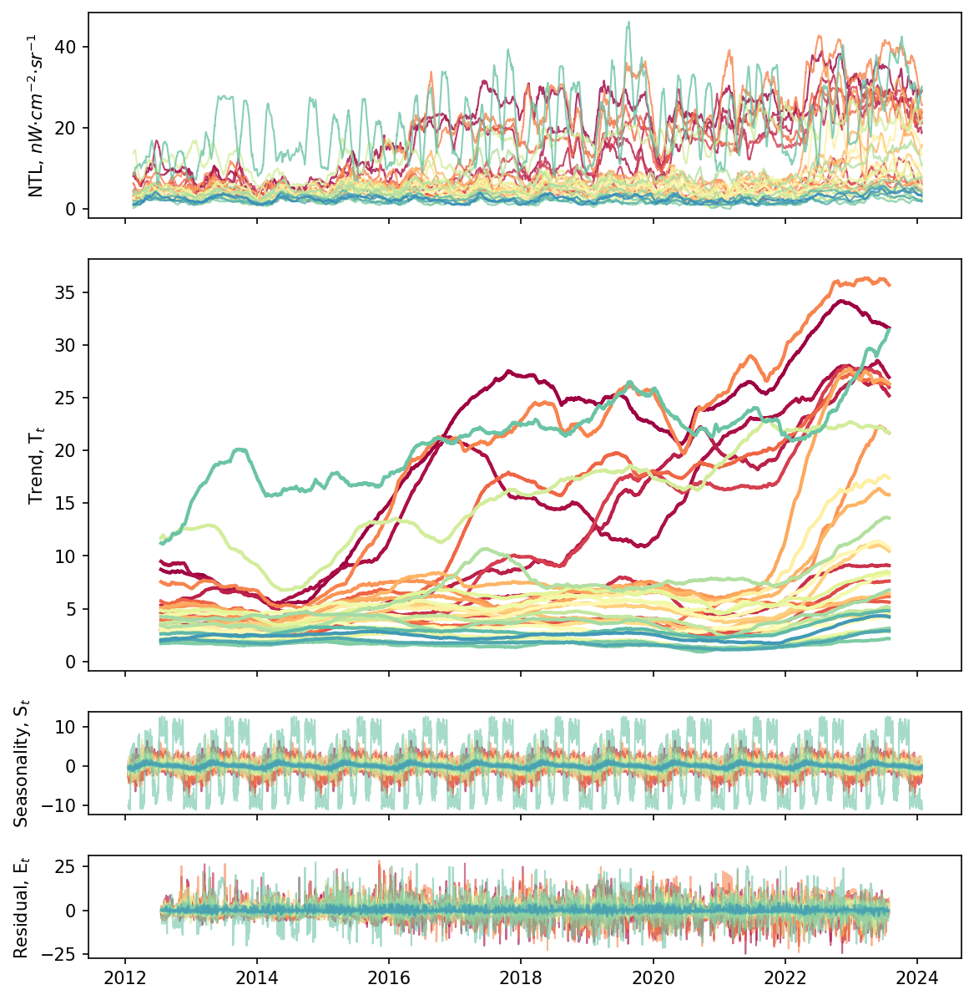

In [33]:
# provinces = df_resettlement['Province'].unique()

# for province in tqdm(select_provinces[:2]):
for province in tqdm(['Leyte', 'Cebu']):
    print('Province: ' + str(province))
    sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].dropna().unique()
    fig, ax = plt.subplots(nrows=4,ncols=1, sharex='col',
                      gridspec_kw={'height_ratios':[0.5,1,0.25,0.25]},
                      figsize=(9,10), dpi = 150)
    
    for i, site in enumerate(sites):
        print('--- Site: ' + str(site))
        data = NTL_STL['Raw'][site].rolling(30).mean()
        line_color = plt.cm.Spectral(i/len(sites))
        ax[0].plot(date_range, data, color = line_color, linewidth = 1, alpha = 0.8)
        ax[0].set_ylabel('NTL, $nW ·cm^{−2}·sr^{−1}$')

        ax[1].plot(date_range, NTL_STL['Trend'][site], color = line_color,
                alpha = 1, label= sites[i], lw = 2)
        ax[1].set_ylabel('Trend, T$_t$')

        ax[2].plot(date_range, NTL_STL['Seasonality'][site], color = line_color,
                linewidth = 1, alpha = 0.6)
        ax[2].set_ylabel('Seasonality, S$_t$')

        ax[3].plot(date_range, NTL_STL['Residual'][site], color = line_color,
            linewidth = 1, alpha = 0.6)
        ax[3].set_ylabel('Residual, E$_t$')
        
    ax[0].plot(NTL_STL_prov['Raw'][province].rolling(30).mean(), 'k-', drawstyle = 'steps-mid',  linewidth = 2, alpha = 1)
    ax[1].plot(NTL_STL_prov['Trend'][province], 'k-', drawstyle = 'steps-mid',  linewidth = 3, alpha = 1, label= str(province) + ' Province')
    ax[2].plot(NTL_STL_prov['Seasonality'][province], 'k-', drawstyle = 'steps-mid',  linewidth = 0.5, alpha = 1)
    ax[3].plot(NTL_STL_prov['Residual'][province], 'k-', drawstyle = 'steps-mid',  linewidth = 0.5, alpha = 1)


    ax[1].legend(fontsize=6, ncol = 5, bbox_to_anchor= (0, 1.05, 1, 0.5), loc="lower left",
                bbox_transform=ax[0].transAxes, fancybox = True, mode='expand')
                #title = str(province) + ' Resettlement Sites')

    for ax in ax:
        ax.grid(alpha = 0.5)
        ax.axvline(datetime.date(2020, 3, 10), color = 'r', lw = 5, alpha = 0.2) #For COVID lockdown
        ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.0f')) # 0 decimal places)
#         ax.minorticks_on()
        ax.xaxis.grid(True, which='minor', alpha = 0.2) 
#         ax.yaxis.set_major_locator(MaxNLocator(integer=True))

    dtFmt = mdates.DateFormatter('%Y') # define the formatting
    plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
#     plt.tight_layout()
    plt.savefig(results_path+str(province)+".png", bbox_inches="tight")
    plt.show()

# Extracting Trend Statistics

In [20]:
locs = df_resettlement.copy()
locs = locs.set_index('Title', drop = 'True', inplace = False)
locs

,index,Calamity,Project Name,Location,Classification,Latitude,Longitude,Buffer,Map URL,Remarks,External Links,External Links.1,Typhoon,Province,Group
Title,,,,,,,,,,,,,,,
Maya Park,0,Typhoon Yolanda (2013),Maya Park Homes,"Brgy. Maya, Daanbantayan, Cebu",Identified,11.271009,124.048967,230.0,https://goo.gl/maps/3L3eRoigGDpjMxHT8,NaN,NaN,https://newsinfo.inquirer.net/944060/poor-nha-...,Yolanda,Cebu,Cebu
Lanao Unity Park,1,Typhoon Yolanda (2013),Lanao Unity Park Homes,"Brgy. Lanao, Daanbantayan, Cebu",Identified,11.248469,124.022224,280.0,https://goo.gl/maps/5SZCHBveYJqorcZ87,NaN,https://daanbantayan.gov.ph/2022/04/04/lanao-u...,NaN,Yolanda,Cebu,Cebu
Daanbantayan 3,2,Typhoon Yolanda (2013),Green Heights 1 (Daanbantayan 3),"Brgy. Tominjao, Daanbantayan, Cebu",Probable,11.221464,124.036788,260.0,https://goo.gl/maps/gjzeHfJ73dMTdiuX8,NaN,NaN,NaN,Yolanda,Cebu,Cebu
Daanbantayan 4,3,Typhoon Yolanda (2013),Green Heights 2 (Daanbantayan 4),"Brgy. Tominjao, Daanbantayan, Cebu",Identified,11.173075,124.015380,160.0,https://goo.gl/maps/1PfPDyVLY4bHvp78A,Adress was wrong on the NHA list. Turn-over da...,https://www.facebook.com/photo/?fbid=165837642...,NaN,Yolanda,Cebu,Cebu
Daanbantayan Site 1,4,Typhoon Yolanda (2013),Kandaya Homes 1 (Daanbantayan Site 1),"Brgy. Tapilon, Daanbantayan Site 1, Cebu",Identified,11.260164,124.036611,160.0,https://goo.gl/maps/2esB7Pmhx5NuNjYYA,Sites were raffled off to beneficiaries. Shape...,https://www.facebook.com/DaanbantayanLGU/photo...,https://www.facebook.com/DaanbantayanLGU/photo...,Yolanda,Cebu,Cebu
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tuba Res,443,Typhoon Pepeng (2009),Tuba Resettlement Proj.,"Tuba, Benguet",Probable,14.604640,121.260761,450.0,Google Maps Link,NaN,NaN,NaN,Pepeng,Benguet,Luzon
Badat,461,Typhoon Yolanda (2013),Brgy. Baldat (28 units),"Culion, Palawan",Probable,11.891470,119.987950,60.0,Apple Maps Link,NaN,NaN,NaN,Yolanda,Palawan,Luzon
Binudac,462,Typhoon Yolanda (2013),Brgy. Binudac (406 units),"Culion, Palawan",Probable,11.820858,119.907452,100.0,NaN,Probable Says it mentions 406 units but the un...,NaN,NaN,Yolanda,Palawan,Luzon


In [21]:
locs['Province'].unique()

array(['Cebu', 'Leyte', 'Samar', 'Biliran', 'Compostela',
       'Davao Oriental', 'Misamis Oriental', 'Lanao Del Norte', 'Albay',
       'Camarines Sur', 'Catanduanes', 'Aklan', 'Antique', 'Capiz',
       'Negros Occidental', 'Negros Oriental', 'Iloilo', 'Bulacan',
       'Laguna', 'Rizal', 'NCR', 'Aurora', 'Benguet', 'Palawan'],
      dtype=object)

## Resettlement Sites

In [22]:
# n_days = len(date_range)
n_days = 4391

In [39]:
from scipy.stats import linregress

NTL_Trend = NTL_STL['Trend'].dropna()

stats_summary = pd.DataFrame(index = df_resettlement['Title'].dropna().values,
                            columns = ['slope', 'intercept', 'r', 'p', 'std'])

for i, site in tqdm(enumerate(stats_summary.index)):
    y = NTL_Trend[site]
    x = np.arange(len(y))
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    stats_summary.loc[site] = np.asarray(linregress(x,y))
    
stats_summary['Province'] = locs['Province']
stats_summary['Typhoon'] = locs['Typhoon']
stats_summary['ROC'] = stats_summary['slope']*n_days
stats_summary['STD'] = stats_summary['std']*n_days
stats_summary['r$^2$'] = stats_summary['r']**2
stats_summary

264it [00:00, 2097.32it/s]


,slope,intercept,r,p,std,Province,Typhoon,ROC,STD,r$^2$
Maya Park,0.003093,3.930961,0.970744,0.0,0.000012,Cebu,Yolanda,13.583276,0.052952,0.942345
Lanao Unity Park,0.002904,1.995547,0.855642,0.0,0.000028,Cebu,Yolanda,12.751002,0.121558,0.732123
Daanbantayan 3,0.000556,2.048673,0.645507,0.0,0.00001,Cebu,Yolanda,2.441083,0.04552,0.41668
Daanbantayan 4,0.000477,1.816366,0.599958,0.0,0.00001,Cebu,Yolanda,2.095343,0.044036,0.35995
Daanbantayan Site 1,0.000468,2.748953,0.712065,0.0,0.000007,Cebu,Yolanda,2.056929,0.031965,0.507037
...,...,...,...,...,...,...,...,...,...,...
Tuba Res,0.009904,15.657048,0.914424,0.0,0.000069,Benguet,Pepeng,43.490092,0.303389,0.836172
Badat,0.000037,1.630142,0.10889,0.0,0.000005,Palawan,Yolanda,0.162242,0.023343,0.011857
Binudac,-0.000112,1.665237,-0.395997,0.0,0.000004,Palawan,Yolanda,-0.490768,0.017935,0.156813
Galoc,-0.000055,1.557557,-0.226923,0.0,0.000004,Palawan,Yolanda,-0.240535,0.01627,0.051494


### Extreme Values

#### ROC

In [40]:
g = stats_summary.sort_values('ROC')
ROC_extremes = pd.concat([g.head(3),g.tail(3)])
ROC_extremes

,slope,intercept,r,p,std,Province,Typhoon,ROC,STD,r$^2$
GK VILLAGE,-0.008511,87.7357,-0.804113,0.0,0.000099,Misamis Oriental,Sendong,-37.370045,0.435417,0.646597
CDO RSHP Phase 3,-0.003235,75.493522,-0.725762,0.0,0.000048,Misamis Oriental,Sendong,-14.203284,0.212184,0.526731
CDO RSHP Phase 2,-0.003029,85.40579,-0.595853,0.0,0.000064,Misamis Oriental,Sendong,-13.298715,0.282488,0.355041
Canitoan Rel Site,0.016114,37.292682,0.886068,0.0,0.000133,Misamis Oriental,Sendong,70.755529,0.583389,0.785116
Southville 8,0.019911,38.042905,0.959697,0.0,0.000092,Rizal,Ondoy,87.427511,0.403497,0.921018
Southville 5,0.035568,105.161986,0.931435,0.0,0.000219,Laguna,Ondoy,156.177913,0.961664,0.86757


6it [00:00, 12.89it/s]


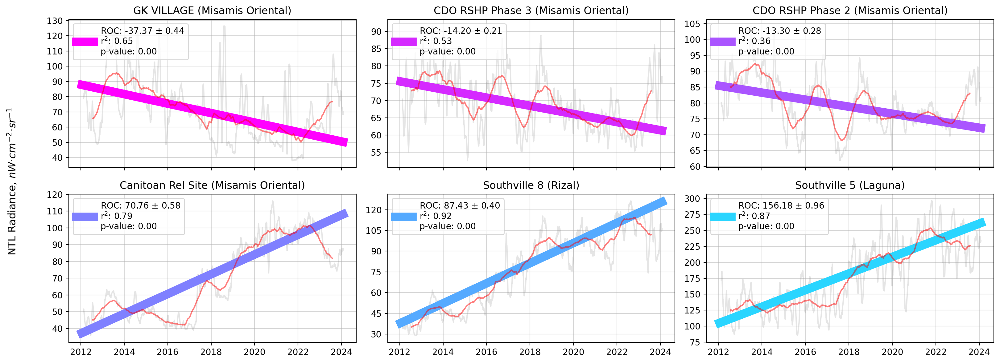

In [41]:
fig, axes = plt.subplots(nrows=2,ncols=3, sharex= True, figsize=(16,6), dpi = 200)

for i, ax in tqdm(enumerate(axes.ravel())):
    site = ROC_extremes.index[i]
    dates = NTL_STL_prov.index
    x = np.linspace(0, len(dates), len(dates))
    slope, intercept, r, p, std, province, Typhoon, ROC, STD, r_2 = ROC_extremes.loc[site]

    ax.grid(alpha = 0.5)
    ax.plot(dates, NTL_STL['Raw'][site].rolling(30).mean(), color = 'gray', 
        alpha = 0.2)
    ax.plot(dates, intercept + slope*x, color = plt.cm.cool_r(i/6), 
            lw = 10, label =  "ROC: %.2f $\pm$ %.2f \nr$^2$: %.2f \np-value: %.2f" % (ROC,STD, r_2, p))
    ax.plot(dates, NTL_STL['Trend'][site], color = 'r', 
            alpha = 0.5)
    ax.set_title(str(site) + ' (' + str(province) +')')
    ax.legend(fontsize=10, ncol = 3, loc="upper left",
            bbox_transform=ax.transAxes, fancybox = True)
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))

fig.supylabel('NTL Radiance, $nW ·cm^{−2}·sr^{−1}$', x = -0.01)        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
ax.xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()

#### r$^2$

In [43]:
h = stats_summary.sort_values('r$^2$')
r_extremes = pd.concat([h.head(3),h.tail(3)])
r_extremes

,slope,intercept,r,p,std,Province,Typhoon,ROC,STD,r$^2$
Bagamanoc Res,0.000001,2.436152,0.00294,0.852022,0.000006,Catanduanes,Nina,0.00485,0.025996,0.000009
Virlyn Heights,-0.000001,1.791664,-0.003545,0.822043,0.000005,Leyte,Yolanda,-0.004706,0.020922,0.000013
Villa Soledad,-0.000003,3.899538,-0.004457,0.77733,0.000011,Leyte,Yolanda,-0.014078,0.049776,0.00002
Maya Park,0.003093,3.930961,0.970744,0.0,0.000012,Cebu,Yolanda,13.583276,0.052952,0.942345
Towerville 4,0.007864,17.548244,0.973334,0.0,0.000029,Bulacan,Ondoy,34.532956,0.128267,0.947379
Don Salvador Heights 2,0.007537,3.928044,0.977266,0.0,0.000026,Negros Occidental,Yolanda,33.09331,0.113151,0.955049


6it [00:00, 17.71it/s]


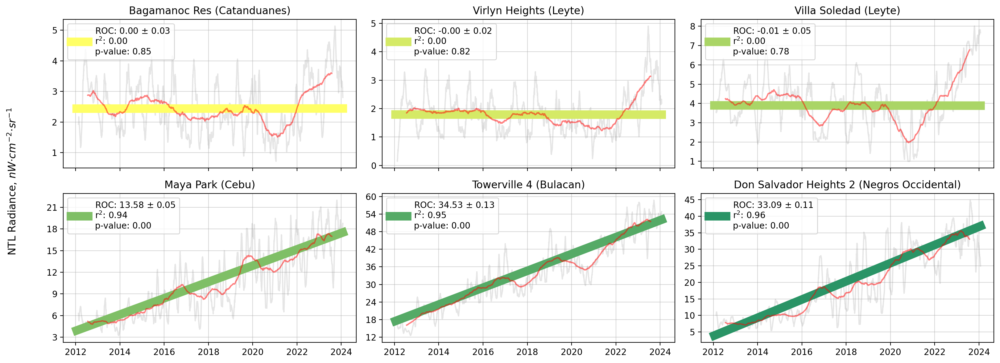

In [44]:
fig, axes = plt.subplots(nrows=2,ncols=3, sharex= True, figsize=(16,6), dpi = 200)

for i, ax in tqdm(enumerate(axes.ravel())):
    site = r_extremes.index[i]
    dates = NTL_STL_prov.index
    x = np.linspace(0, len(dates), len(dates))
    slope, intercept, r, p, std, province, Typhoon, ROC, STD, r_2 = r_extremes.loc[site]

    ax.grid(alpha = 0.5)
    ax.plot(dates, NTL_STL['Raw'][site].rolling(30).mean(), color = 'gray', 
        alpha = 0.2)
    ax.plot(dates, intercept + slope*x, color = plt.cm.summer_r(i/6), 
            lw = 10, label =  "ROC: %.2f $\pm$ %.2f \nr$^2$: %.2f \np-value: %.2f" % (ROC,STD, r_2, p))
    ax.plot(dates, NTL_STL['Trend'][site], color = 'r', 
            alpha = 0.5)
    ax.set_title(str(site) + ' (' + str(province) +')')
    ax.legend(fontsize=10, ncol = 3, loc="upper left",
            bbox_transform=ax.transAxes, fancybox = True)
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))

fig.supylabel('NTL Radiance, $nW ·cm^{−2}·sr^{−1}$', x = -0.01)        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
ax.xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()

### histograms

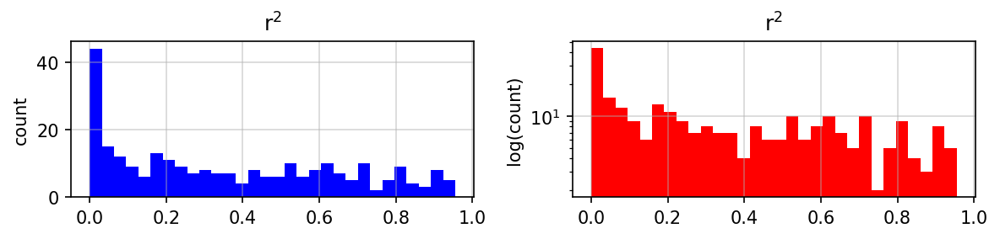

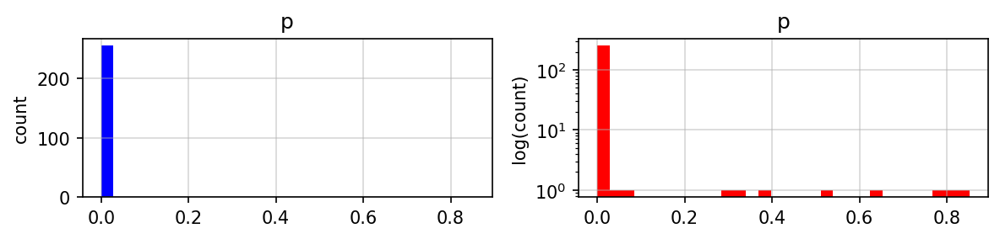

In [43]:
def show_hist(dataframe, stats_list):
    for stats in stats_list:
        plt.figure(figsize=(8,2), dpi = 150)
        plt.subplot(121)
        plt.hist(dataframe[stats], bins = 30, color = 'blue')
        plt.grid(alpha = 0.5)
        plt.title(str(stats))
        plt.ylabel('count')

        plt.subplot(122)
        plt.hist(dataframe[stats], bins = 30, color = 'red')
        plt.yscale('log')
        plt.grid(alpha = 0.5)
        plt.title(str(stats))
        plt.ylabel('log(count)')
        plt.tight_layout()
        plt.show()
        
# show_hist(stats_summary.columns)
show_hist(stats_summary, ['r$^2$', 'p'])

## Provinces

In [45]:
NTL_Trend_prov = NTL_STL_prov['Trend'].dropna()

stats_summary_prov = pd.DataFrame(index = NTL_provincial.columns.dropna(),
                            columns = ['slope', 'intercept', 'r', 'p', 'std'])

# stats_summary_prov
for i, prov in tqdm(enumerate(stats_summary_prov.index)):
    y = NTL_Trend_prov[prov]
    x = np.arange(len(y))
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    stats_summary_prov.loc[prov] = np.asarray(linregress(x,y))
    
stats_summary_prov['ROC'] = stats_summary_prov['slope']*n_days
stats_summary_prov['STD'] = stats_summary_prov['std']*n_days
stats_summary_prov['r$^2$'] = stats_summary_prov['r']**2
stats_summary_prov

16it [00:00, 1293.24it/s]


,slope,intercept,r,p,std,ROC,STD,r$^2$
Leyte,0.000068,3.391818,0.197208,0.0,0.000005,0.299207,0.023442,0.038891
Iloilo,0.000323,4.245843,0.616473,0.0,0.000006,1.417769,0.028539,0.380039
Antique,0.000032,2.616882,0.109077,0.0,0.000005,0.141972,0.020391,0.011898
Cebu,0.00069,11.804982,0.6916,0.0,0.000011,3.030277,0.049877,0.478311
Samar,-0.000116,3.054172,-0.368414,0.0,0.000005,-0.509114,0.020247,0.135729
Compostela,0.000044,2.158204,0.159202,0.0,0.000004,0.193026,0.018865,0.025345
Misamis Oriental,0.000054,7.457857,0.134108,0.0,0.000006,0.236012,0.027485,0.017985
Negros Occidental,0.000161,4.270052,0.418174,0.0,0.000006,0.705803,0.024163,0.17487
Albay,0.000295,3.452114,0.612323,0.0,0.000006,1.29432,0.026338,0.374939
Aklan,0.000122,2.759615,0.326391,0.0,0.000006,0.53548,0.02444,0.106531


In [46]:
show_hist(stats_summary_prov, ['r$^2$', 'ROC'])

NameError: name 'show_hist' is not defined

16it [00:00, 17.55it/s]


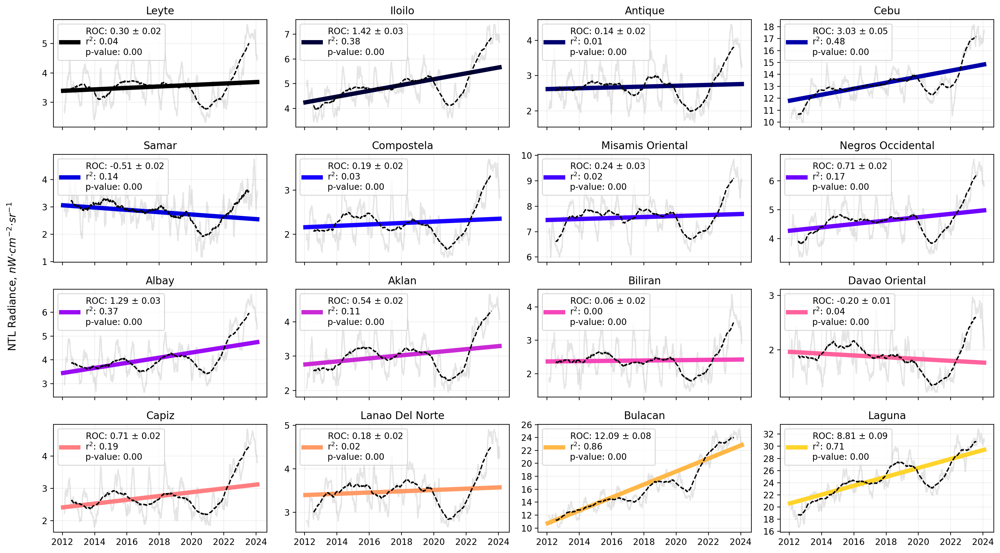

In [47]:
fig, axes = plt.subplots(nrows=4,ncols=4, sharex= True, figsize=(16,9), dpi = 200)

for i, ax in tqdm(enumerate(axes.ravel())):
    province = NTL_Trend_prov.columns[i]
    dates = NTL_STL_prov.index
    x = np.linspace(0, len(dates), len(dates))
    
    slope, intercept, r, p, std, ROC, STD, r_2 = stats_summary_prov.loc[province] 
    ax.grid(alpha = 0.2)
    ax.plot(dates, NTL_STL_prov['Raw'][province].rolling(30).mean(), color = 'gray', 
        alpha = 0.2)
#     ax.plot(dates, intercept + slope*x, color = 'k', lw = 6), 
    ax.plot(dates, intercept + slope*x, color = plt.cm.gnuplot2(i/18), ls = '-',
            lw = 5, label =  "ROC: %.2f $\pm$ %.2f \nr$^2$: %.2f \np-value: %.2f" % (ROC,STD, r_2, p))
    ax.plot(dates, NTL_STL_prov['Trend'][province], 'k--')
    ax.set_title(str(province))
    ax.legend(fontsize=10, ncol = 3, loc="upper left",
            bbox_transform=ax.transAxes, fancybox = True)
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))

fig.supylabel('NTL Radiance, $nW ·cm^{−2}·sr^{−1}$', x = -0.005)        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
ax.xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()
plt.savefig(results_path+"Provincial_Best_Fit.png", bbox_inches="tight")
plt.show()

Province: Leyte
Province: Iloilo
Province: Antique
Province: Cebu
Province: Samar
Province: Compostela
Province: Misamis Oriental
Province: Negros Occidental
Province: Albay
Province: Aklan
Province: Biliran
Province: Davao Oriental
Province: Capiz
Province: Lanao Del Norte
Province: Bulacan
Province: Laguna


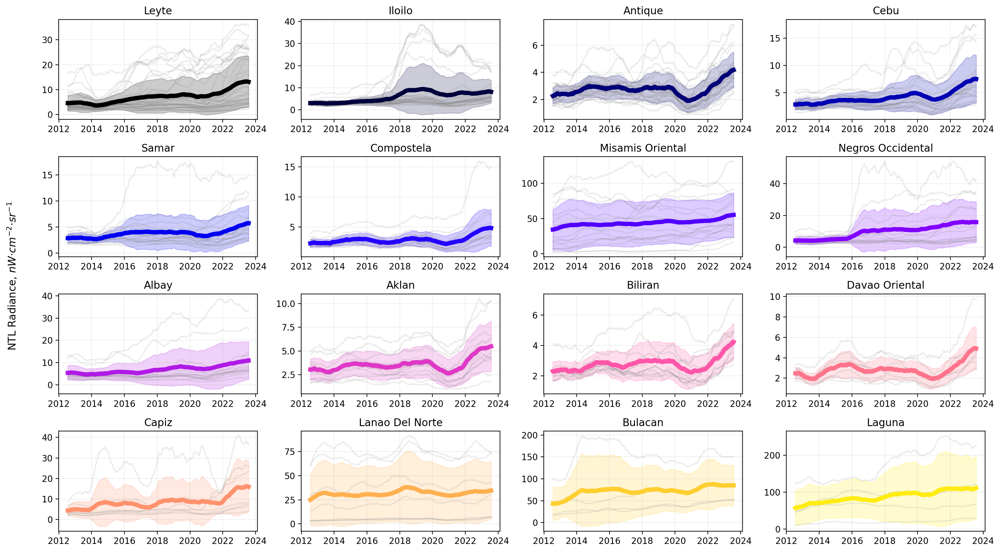

In [48]:
fig, axes = plt.subplots(nrows=4,ncols=4, figsize=(16,9), dpi = 200)


for p, ax in enumerate(axes.ravel()):
    province = NTL_Trend_prov.columns[p]
    dates = NTL_STL.index
    print('Province: ' + str(province))
    sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].dropna().unique()
    
    line_color = plt.cm.gnuplot2(p/17)

    data = NTL_STL['Trend'][sites]
    data_mean = data.mean(axis=1)
    data_std = data.std(axis=1)
    
    ax.grid(alpha = 0.2)

    ax.plot(data, color = 'gray', alpha = 0.15)

    ax.fill_between(data.index,data_mean+data_std, data_mean-data_std, label='STD', 
                    alpha=0.2, color=line_color)
    ax.plot(data_mean, color = line_color, lw = 5)
    ax.set_title(str(province))
    
fig.supylabel('NTL Radiance, $nW ·cm^{−2}·sr^{−1}$', x = -0.005)        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()
# plt.savefig(results_path+"Provincial_Resettlements.png", bbox_inches="tight")
plt.show()

## STL Visualization for Paper

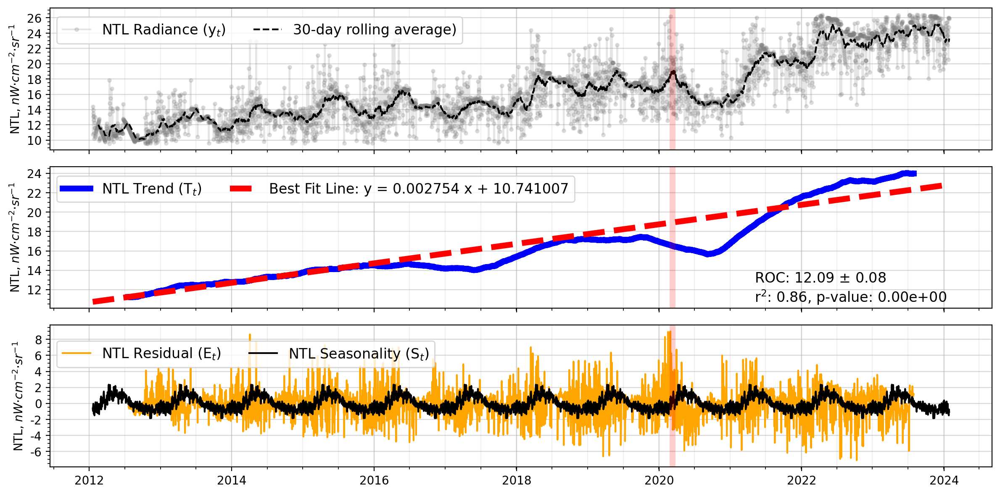

In [48]:
fig, ax = plt.subplots(nrows=3,ncols=1, sharex='col',
                  gridspec_kw={'height_ratios':[1,1,1]},
                  figsize=(12,6), dpi = 200)
fig.patch.set_facecolor('None')

province = 'Bulacan'

slope, intercept, r, p, std, ROC, STD, r_2 = stats_summary_prov.loc[province] 

NTL_raw = NTL_STL_prov['Raw'][province]
NTL_trend = NTL_STL_prov['Trend'][province]
NTL_seasonality = NTL_STL_prov['Seasonality'][province]
NTL_residual = NTL_STL_prov['Residual'][province]

ax[0].plot(NTL_raw, color = 'gray', marker = '.', alpha = 0.2,
           label = 'NTL Radiance (y$_t$)')
ax[0].plot(NTL_raw.rolling(30).mean(), 'k--',
           label = '30-day rolling average)')

ax[0].legend(fontsize=12, ncol = 2, bbox_to_anchor= (0, 0.7, 1, 0.5), loc="lower left",
            bbox_transform=ax[0].transAxes, fancybox = True, facecolor = 'white')

ax[1].plot(NTL_trend, color = 'blue', drawstyle = 'steps-mid', lw = 5,
           label = 'NTL Trend (T$_t$)')
ax[1].plot(dates, intercept + slope*x, 'r--', lw = 5, 
           label = "Best Fit Line: y = %.6f x + %.6f" % (slope,intercept))

ax[1].text(dates[-1000],intercept, 
           "\nROC: %.2f $\pm$ %.2f \nr$^2$: %.2f, p-value: %.2e" % ( ROC,STD, r_2, p),
          fontsize = 12)

ax[1].legend(fontsize=12, ncol = 2, bbox_to_anchor= (0, 0.7, 1, 0.5), loc="lower left",
            bbox_transform=ax[1].transAxes, fancybox = True, facecolor = 'white')


ax[2].plot(NTL_residual, color = 'orange', label = 'NTL Residual (E$_t$)')
ax[2].plot(NTL_seasonality, color = 'black', label = 'NTL Seasonality (S$_t$)')
ax[2].legend(fontsize=12, ncol = 2, bbox_to_anchor= (0, 0.65, 1, 0.5), loc="lower left",
            bbox_transform=ax[2].transAxes, fancybox = True, facecolor = 'white')
for ax in ax:
    ax.grid(alpha = 0.5)
    ax.axvline(datetime.date(2020, 3, 10), color = 'r', lw = 5, alpha = 0.2) #For COVID lockdown
    ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.0f')) # 0 decimal places)
    ax.minorticks_on()
    ax.xaxis.grid(True, which='minor', alpha = 0.2) 
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.set_ylabel('NTL, $nW ·cm^{−2}·sr^{−1}$')


plt.tight_layout()
# plt.savefig(results_path+"Prov_STL.png", bbox_inches="tight")
plt.show()

In [49]:
select_provinces = select_provinces + ['Bulacan', 'Laguna']
select_provinces

['Leyte',
 'Iloilo',
 'Antique',
 'Cebu',
 'Samar',
 'Compostela',
 'Misamis Oriental',
 'Negros Occidental',
 'Albay',
 'Aklan',
 'Biliran',
 'Davao Oriental',
 'Capiz',
 'Lanao Del Norte',
 'Bulacan',
 'Laguna']

In [50]:
order = ['Leyte', 'Samar', 'Biliran', 'Cebu', 'Iloilo', 'Antique',
         'Negros Occidental', 'Aklan', 'Capiz',  'Albay',
         'Compostela',  'Davao Oriental',  
         'Misamis Oriental',  'Lanao Del Norte',
         'Bulacan',  'Laguna']

# PNRR

In [63]:
# mask = stats_summary['Province'].isin(select_provinces)
# select_sites = stats_summary[mask]
# select_sites['Province'].cat.reorder_categories(select_provinces, inplace= True)
# select_sites

In [51]:
# Assuming stats_summary is your DataFrame
mask = stats_summary['Province'].isin(order)
select_sites = stats_summary[mask]

# Display the result
select_sites

,slope,intercept,r,p,std,Province,Typhoon,ROC,STD,r$^2$
Maya Park,0.003093,3.930961,0.970744,0.0,0.000012,Cebu,Yolanda,13.583276,0.052952,0.942345
Lanao Unity Park,0.002904,1.995547,0.855642,0.0,0.000028,Cebu,Yolanda,12.751002,0.121558,0.732123
Daanbantayan 3,0.000556,2.048673,0.645507,0.0,0.00001,Cebu,Yolanda,2.441083,0.04552,0.41668
Daanbantayan 4,0.000477,1.816366,0.599958,0.0,0.00001,Cebu,Yolanda,2.095343,0.044036,0.35995
Daanbantayan Site 1,0.000468,2.748953,0.712065,0.0,0.000007,Cebu,Yolanda,2.056929,0.031965,0.507037
...,...,...,...,...,...,...,...,...,...,...
Towerville 4,0.007864,17.548244,0.973334,0.0,0.000029,Bulacan,Ondoy,34.532956,0.128267,0.947379
Southville 3,-0.000318,62.721792,-0.073481,0.000003,0.000068,Laguna,Ondoy,-1.397571,0.298942,0.005399
Southville 4,0.010791,73.004943,0.781536,0.0,0.000136,Laguna,Ondoy,47.383289,0.596111,0.610798
Southville 5,0.035568,105.161986,0.931435,0.0,0.000219,Laguna,Ondoy,156.177913,0.961664,0.86757


In [52]:
# PNRR = pd.DataFrame(index = select_sites.index.values,
#                             columns = ['PNRR'])

baseline_comparison = pd.DataFrame(index = select_sites.index.values,
                            columns = ['Prov ROC', 'PNRR'])
for site in tqdm(select_sites.index):
    province = select_sites.loc[site]['Province']    
    ROC_site = select_sites.loc[site]['ROC']

    ROC_prov = stats_summary_prov.loc[province]['ROC']
    baseline_comparison['Prov ROC'].loc[site] = ROC_prov
    baseline_comparison['PNRR'].loc[site] = ROC_site/ROC_prov

baseline_comparison

100%|███████████████████████████████████████| 249/249 [00:00<00:00, 2993.36it/s]


,Prov ROC,PNRR
Maya Park,3.030277,4.482519
Lanao Unity Park,3.030277,4.207867
Daanbantayan 3,3.030277,0.805564
Daanbantayan 4,3.030277,0.691469
Daanbantayan Site 1,3.030277,0.678792
...,...,...
Towerville 4,12.09264,2.8557
Southville 3,8.812341,-0.158592
Southville 4,8.812341,5.376924
Southville 5,8.812341,17.722636


In [53]:
stats_summary['PNRR'] = baseline_comparison['PNRR']
stats_summary['Prov ROC'] = baseline_comparison['Prov ROC']

stats_summary.head(10)

,slope,intercept,r,p,std,Province,Typhoon,ROC,STD,r$^2$,PNRR,Prov ROC
Maya Park,0.003093,3.930961,0.970744,0.0,0.000012,Cebu,Yolanda,13.583276,0.052952,0.942345,4.482519,3.030277
Lanao Unity Park,0.002904,1.995547,0.855642,0.0,0.000028,Cebu,Yolanda,12.751002,0.121558,0.732123,4.207867,3.030277
Daanbantayan 3,0.000556,2.048673,0.645507,0.0,0.00001,Cebu,Yolanda,2.441083,0.04552,0.41668,0.805564,3.030277
Daanbantayan 4,0.000477,1.816366,0.599958,0.0,0.00001,Cebu,Yolanda,2.095343,0.044036,0.35995,0.691469,3.030277
Daanbantayan Site 1,0.000468,2.748953,0.712065,0.0,0.000007,Cebu,Yolanda,2.056929,0.031965,0.507037,0.678792,3.030277
Daanbantayan Site 2,0.00128,2.47232,0.84552,0.0,0.000013,Cebu,Yolanda,5.62232,0.055956,0.714905,1.855382,3.030277
Olivo Heights,0.000649,2.10009,0.839802,0.0,0.000007,Cebu,Yolanda,2.851482,0.029052,0.705267,0.940997,3.030277
Northview Park,0.000931,2.980222,0.904174,0.0,0.000007,Cebu,Yolanda,4.088079,0.030439,0.81753,1.349077,3.030277
Northview Park 2,0.000193,2.50091,0.381489,0.0,0.000007,Cebu,Yolanda,0.84688,0.032341,0.145534,0.279473,3.030277
Lawis Residences,0.000352,2.555923,0.534441,0.0,0.000009,Cebu,Yolanda,1.547545,0.038572,0.285628,0.510694,3.030277


In [54]:
show_hist(stats_summary, ['PNRR'])

NameError: name 'show_hist' is not defined

In [55]:
j = stats_summary.sort_values('PNRR').dropna()
pnrr_extremes = pd.concat([j.head(3),j.tail(3)])
pnrr_extremes

,slope,intercept,r,p,std,Province,Typhoon,ROC,STD,r$^2$,PNRR,Prov ROC
GK VILLAGE,-0.008511,87.7357,-0.804113,0.0,0.000099,Misamis Oriental,Sendong,-37.370045,0.435417,0.646597,-158.339422,0.236012
Highland Residences,-0.002453,79.353193,-0.409857,0.0,0.000086,Lanao Del Norte,Sendong,-10.770996,0.377793,0.167982,-61.004735,0.17656
CDO RSHP Phase 3,-0.003235,75.493522,-0.725762,0.0,0.000048,Misamis Oriental,Sendong,-14.203284,0.212184,0.526731,-60.180278,0.236012
NHA-CDO VIII 1,0.008176,6.624316,0.956955,0.0,0.000039,Misamis Oriental,Sendong,35.902568,0.171613,0.915762,152.12162,0.236012
Calaanan Mahogany,0.009763,48.089071,0.854694,0.0,0.000093,Misamis Oriental,Sendong,42.868736,0.410365,0.730503,181.637751,0.236012
Canitoan Rel Site,0.016114,37.292682,0.886068,0.0,0.000133,Misamis Oriental,Sendong,70.755529,0.583389,0.785116,299.795986,0.236012


6it [00:00, 20.34it/s]


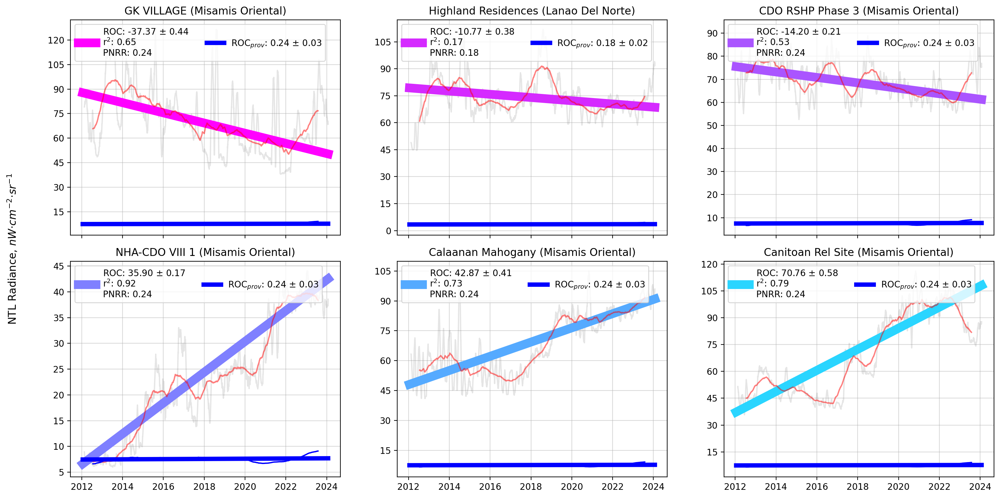

In [55]:
fig, axes = plt.subplots(nrows=2,ncols=3, sharex= True, figsize=(16,8), dpi = 200)

for i, ax in tqdm(enumerate(axes.ravel())):
    site = pnrr_extremes.index[i]
    dates = NTL_STL_prov.index
    x = np.linspace(0, len(dates), len(dates))
    
    slope, intercept, r, p, std, province, Typhoon, ROC, STD, r_2, prov_ROC, PNRR = pnrr_extremes.loc[site]

    ax.grid(alpha = 0.5)
    ax.plot(dates, NTL_STL['Raw'][site].rolling(30).mean(), color = 'gray', 
        alpha = 0.2)
    ax.plot(dates, intercept + slope*x, color = plt.cm.cool_r(i/6), 
            lw = 10, label =  "ROC: %.2f $\pm$ %.2f \nr$^2$: %.2f \nPNRR: %.2f" % (ROC,STD, r_2, PNRR))
    ax.plot(dates, NTL_STL['Trend'][site], color = 'r', 
            alpha = 0.5)
    
    ax.set_title(str(site) + ' (' + str(province) +')')

    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    
    # Provincial Baseline
        
    slope_p, intercept_p, r_p, p_p, std_p, ROC_p, STD_p, r_2_p = stats_summary_prov.loc[province] 
    ax.plot(dates, intercept_p + slope_p*x, color = 'b', 
            lw = 5, label =  "ROC$_{prov}$: %.2f $\pm$ %.2f" % (ROC_p,STD_p))
    ax.plot(dates, NTL_STL_prov['Trend'][province], color = 'b')
    
    
    ax.legend(fontsize=10, ncol = 3, loc="upper left",
            bbox_transform=ax.transAxes, fancybox = True)
#     ax.set_xscale('log')
#     ax.set_yscale('log')

fig.supylabel('NTL Radiance, $nW ·cm^{−2}·sr^{−1}$', x = -0.01)        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
ax.xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()

In [57]:
stats_summary_final = stats_summary[mask]

# Convert 'Province' column to categorical type
stats_summary_final['Province'] = stats_summary_final['Province'].astype('category')

# Reorder categories
stats_summary_final['Province'].cat.reorder_categories(order, inplace=True)

# Sort the DataFrame based on the reordered 'Province' categories
stats_summary_final = stats_summary_final.sort_values(by='Province')

slope = stats_summary_final['slope']
intercept = stats_summary_final['intercept']

ROC = pd.to_numeric(stats_summary_final['ROC'], errors='coerce')#stats_summary_final['ROC']
STD = stats_summary_final['STD']
r_2 = stats_summary_final['r$^2$']

prov_ROC = stats_summary_final['Prov ROC']

prov = stats_summary_final['Province']
typh = stats_summary_final['Typhoon']
PNRR = pd.to_numeric(stats_summary_final['PNRR'], errors='coerce')#stats_summary_final['PNRR']
angle = stats_summary_final['Angle'] = np.arctan(PNRR/ROC)

stats_summary_final

,slope,intercept,r,p,std,Province,Typhoon,ROC,STD,r$^2$,PNRR,Prov ROC,Angle
Dagami Town Ville,0.000088,2.237105,0.231907,0.0,0.000006,Leyte,Yolanda,0.387293,0.025603,0.053781,1.294397,0.299207,1.280067
St. Francis Village,0.007814,4.021726,0.951679,0.0,0.00004,Leyte,Yolanda,34.309627,0.174487,0.905692,114.668351,0.299207,1.280067
Ver Dominic Heights,0.003722,0.755409,0.664135,0.0,0.000066,Leyte,Yolanda,16.34353,0.289954,0.441075,54.622736,0.299207,1.280067
Prime Town Phase 1,0.001801,3.396628,0.723502,0.0,0.000027,Leyte,Yolanda,7.906381,0.118892,0.523455,26.42441,0.299207,1.280067
Prime Town Phase 3,0.000431,3.247874,0.512758,0.0,0.000011,Leyte,Yolanda,1.890688,0.049892,0.262921,6.318987,0.299207,1.280067
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Towerville 4,0.007864,17.548244,0.973334,0.0,0.000029,Bulacan,Ondoy,34.532956,0.128267,0.947379,2.8557,12.09264,0.082507
Southville 5,0.035568,105.161986,0.931435,0.0,0.000219,Laguna,Ondoy,156.177913,0.961664,0.86757,17.722636,8.812341,0.112994
Southville 3,-0.000318,62.721792,-0.073481,0.000003,0.000068,Laguna,Ondoy,-1.397571,0.298942,0.005399,-0.158592,8.812341,0.112994
Southville 4,0.010791,73.004943,0.781536,0.0,0.000136,Laguna,Ondoy,47.383289,0.596111,0.610798,5.376924,8.812341,0.112994


### Random Sites

6it [00:00, 12.42it/s]


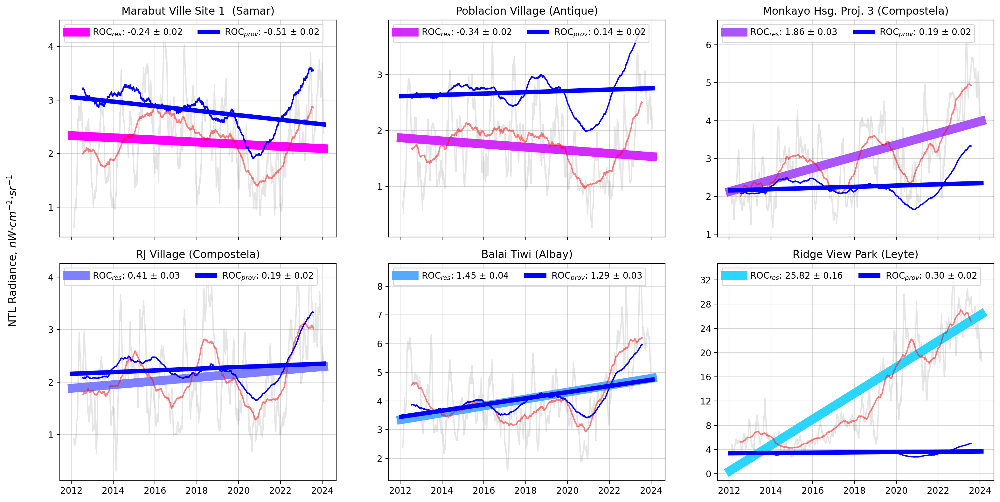

In [58]:
fig, axes = plt.subplots(nrows=2,ncols=3, sharex= True, figsize=(16,8), dpi = 200)

for i, ax in tqdm(enumerate(axes.ravel())):
    j = np.random.randint(len(stats_summary_final))
    site = stats_summary_final.index[j]
    dates = NTL_STL_prov.index
    x = np.linspace(0, len(dates), len(dates))
    
    slope, intercept, r, p, std, province, Typhoon, ROC, STD, r_2, PNRR, Prov_ROC, angle = stats_summary_final.loc[site]

    ax.grid(alpha = 0.5)
    ax.plot(dates, NTL_STL['Raw'][site].rolling(30).mean(), color = 'gray', 
        alpha = 0.2)
    ax.plot(dates, intercept + slope*x, color = plt.cm.cool_r(i/6), 
            lw = 10, label =  "ROC$_{res}$: %.2f $\pm$ %.2f" % (ROC,STD))
#             label =  "ROC$_{res}$: %.2f $\pm$ %.2f \nr$^2$: %.2f \nPNRR: %.2f" % (ROC,STD, r_2, PNRR))
    ax.plot(dates, NTL_STL['Trend'][site], color = 'r', 
            alpha = 0.5)
    
    ax.set_title(str(site) + ' (' + str(province) +')')

    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    
    # Provincial Baseline
        
    slope_p, intercept_p, r_p, p_p, std_p, ROC_p, STD_p, r_2_p = stats_summary_prov.loc[province] 
    ax.plot(dates, intercept_p + slope_p*x, color = 'b', 
            lw = 5, label =  "ROC$_{prov}$: %.2f $\pm$ %.2f" % (ROC_p,STD_p))
    ax.plot(dates, NTL_STL_prov['Trend'][province], color = 'b')
    
    
    ax.legend(fontsize=10, ncol = 3, loc="upper left",
            bbox_transform=ax.transAxes, fancybox = True)
#     ax.set_xscale('log')
#     ax.set_yscale('log')

fig.supylabel('NTL Radiance, $nW ·cm^{−2}·sr^{−1}$', x = -0.01)        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
ax.xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()

In [79]:
stats_summary_prov.loc["Bulacan"]

slope         0.002754
intercept    10.741007
r              0.92912
p                  0.0
std           0.000017
ROC           12.09264
STD            0.07585
r$^2$         0.863264
Name: Bulacan, dtype: object

In [78]:
stats_summary_final.loc[ "Towerville 6"]

slope         0.011997
intercept    41.489541
r             0.953423
p                  0.0
std            0.00006
Province       Bulacan
Typhoon        Pedring
ROC          52.678878
STD           0.262661
r$^2$         0.909016
PNRR          4.356276
Prov ROC      12.09264
Angle         0.082507
Name: Towerville 6, dtype: object

6it [00:00, 12.73it/s]


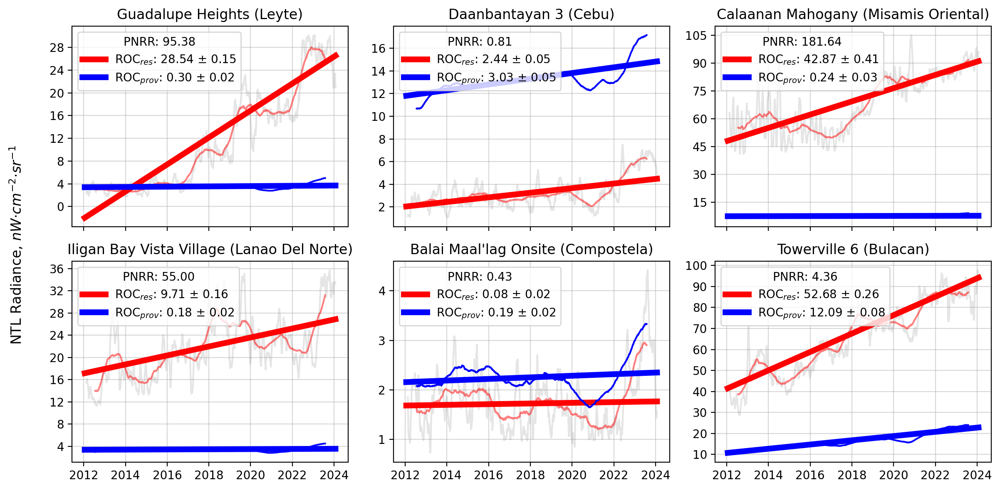

In [89]:
fig, axes = plt.subplots(nrows=2,ncols=3, sharex= True, figsize=(12,6), dpi = 200)
# fig, axes = plt.subplots(1,1, sharex= True, figsize=(16,8), dpi = 200)

sites = ["Guadalupe Heights", "Daanbantayan 3","Calaanan Mahogany",
         "Iligan Bay Vista Village", "Balai Maal'lag Onsite", "Towerville 6"]

for i, ax in tqdm(enumerate(axes.ravel())):
    site = sites[i]
    dates = NTL_STL_prov.index
    x = np.linspace(0, len(dates), len(dates))    
    
    slope, intercept, r, p, std, province, Typhoon, ROC, STD, r_2, PNRR, Prov_ROC, angle = stats_summary_final.loc[site]
    ax.grid(alpha = 0.5)
    ax.plot(dates, NTL_STL['Raw'][site].rolling(30).mean(), color = 'gray', 
        alpha = 0.2)
    ax.plot(dates, intercept + slope*x, color = 'r', 
            lw = 5, label =  "ROC$_{res}$: %.2f $\pm$ %.2f" % (ROC,STD))
#                 label =  "ROC$_{res}$: %.2f $\pm$ %.2f \nr$^2$: %.2f \nPNRR: %.2f" % (ROC,STD, r_2, PNRR))
    ax.plot(dates, NTL_STL['Trend'][site], color = 'r', 
            alpha = 0.5)

    ax.set_title(str(site) + ' (' + str(province) +')')

    ax.yaxis.set_major_locator(MaxNLocator(integer=True))

        # Provincial Baseline
    slope_p, intercept_p, r_p, p_p, std_p, ROC_p, STD_p, r_2_p = stats_summary_prov.loc[province] 
    ax.plot(dates, intercept_p + slope_p*x, color = 'b', 
            lw = 5, label =  "ROC$_{prov}$: %.2f $\pm$ %.2f" % (ROC_p,STD_p))
    ax.plot(dates, NTL_STL_prov['Trend'][province], color = 'b')
    
    ax.legend(fontsize=10, ncol = 1, loc="upper left", title = "PNRR: %.2f" % (PNRR),
            bbox_transform=ax.transAxes, fancybox = True, facecolor = 'white')

fig.supylabel('NTL Radiance, $nW ·cm^{−2}·sr^{−1}$', x = 0)        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
ax.xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()

In [425]:
NTL_STL['Raw']['Samar Forestdale I']

2012-01-19    0.622951
2012-01-20    1.131148
2012-01-21    0.754098
2012-01-22    0.377049
2012-01-23    0.377049
                ...   
2024-01-23    1.000000
2024-01-24    1.000000
2024-01-25    1.000000
2024-01-26    1.000000
2024-01-27    1.000000
Freq: D, Name: Samar Forestdale I, Length: 4392, dtype: float64

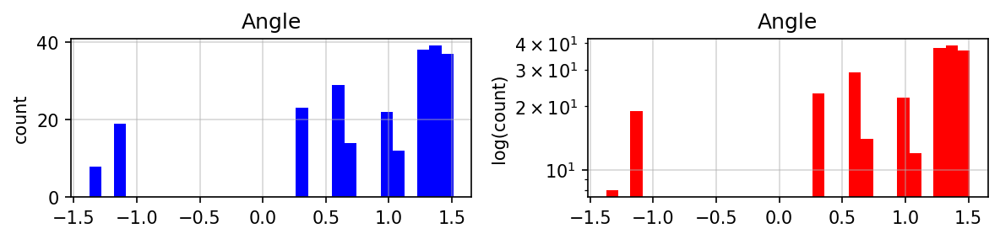

In [58]:
show_hist(stats_summary_final, ['Angle'])

In [ ]:
fig, ax = plt.subplots(1,2, dpi = 300, figsize = (12,5))


scatter_plot_1 = sns.scatterplot(x=ROC, y=PNRR, 
                hue=prov, palette="Spectral", ax = ax[0], alpha = 0.8, legend = False, ec= 'k')

rect = patches.Rectangle((-10, -10), 20, 20, linewidth=3, edgecolor='b', facecolor='none')
ax[0].add_patch(rect)
scatter_plot_2 = sns.scatterplot(x=ROC, y=PNRR, hue=prov,
            palette="Spectral", ax = ax[1], alpha = 0.8, ec = 'k')
ax[1].set_xlim(-10,10)
ax[1].set_ylim(-10,10)
ax[1].patch.set(lw=4, ec='blue')


# Create a legend for the second subplot
legend_2 = ax[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=12)

for ax in ax: 
    ax.grid(alpha = 0.3)
    ax.axvline(0, color = 'k', alpha = 0.5)
    ax.axhline(0, color = 'k', alpha = 0.5)
    ax.minorticks_on()
#     ax.xaxis.grid(True, which='minor', alpha = 0.2) 
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))


fig.supylabel('Provincial NTL Rise Ratio (PNRR)', fontsize = 12)
fig.supxlabel('Rate of Change (ROC), $nW ·cm^{−2}·sr^{−1}$',  fontsize = 12)
fig.tight_layout()
# plt.savefig(results_path + "BM_stats_summary_provinces.png", bbox_inches="tight")

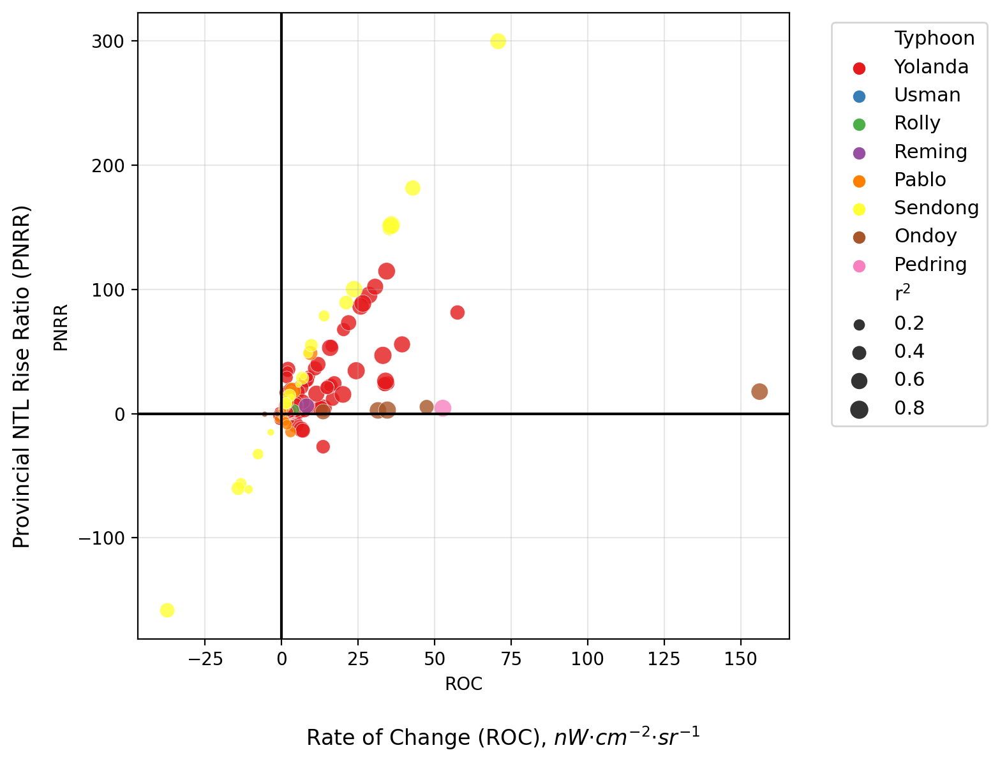

In [89]:
fig, ax = plt.subplots(1,1, dpi = 200, figsize = (8,6))#, sharey = True)

ax.grid(alpha = 0.3)
plt.axvline(0, color = 'k')
plt.axhline(0, color = 'k')
scatter_plot_1 = sns.scatterplot(x=ROC, y=PNRR, size = r_2, hue=typh,
            sizes=(10, 100), palette="Set1", ax = ax, alpha = 0.8, legend = True)

ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=11)

fig.supylabel('Provincial NTL Rise Ratio (PNRR)', fontsize = 12)
fig.supxlabel('Rate of Change (ROC), $nW ·cm^{−2}·sr^{−1}$',  fontsize = 12)
fig.tight_layout()
plt.savefig(path + "BM_stats_summary_provinces.png", bbox_inches="tight")

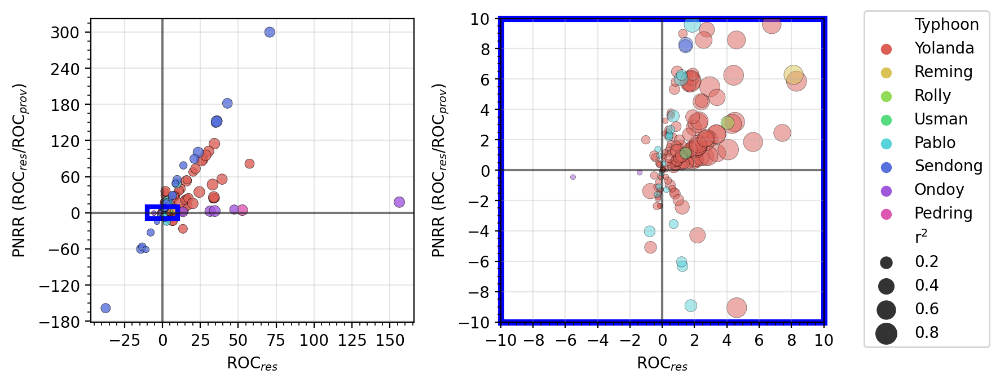

In [409]:
fig, ax = plt.subplots(1,2, dpi = 200, figsize = (9,3.5))

palette = sns.color_palette('hls', 8)

scatter_plot_1 = sns.scatterplot(x=ROC, y=PNRR, size = r_2, hue=typh,
            sizes=(10, 50), palette=palette, ax = ax[0], alpha = 0.8, legend = False, ec = 'k')

rect = patches.Rectangle((-10, -10), 20, 20, linewidth=3, edgecolor='b', facecolor='none')
ax[0].add_patch(rect)
scatter_plot_2 = sns.scatterplot(x=ROC, y=PNRR, size = r_2, hue=typh,
            sizes=(10, 200), palette=palette, ax = ax[1], alpha = 0.5, ec = 'k')
ax[1].set_xlim(-10,10)
ax[1].set_ylim(-10,10)
ax[1].patch.set(lw=4, ec='blue')


# Create a legend for the second subplot
legend_2 = ax[1].legend(loc='upper left', bbox_to_anchor=(1.10, 1.05), fontsize=10)

for ax in ax: 
    ax.grid(alpha = 0.3)
    ax.axvline(0, color = 'k', alpha = 0.5)
    ax.axhline(0, color = 'k', alpha = 0.5)
    ax.minorticks_on()
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax.set_xlabel('ROC$_{res}$')
    ax.set_ylabel('PNRR (ROC$_{res}$/ROC$_{prov}$)')



# fig.supylabel('Provincial NTL Rise Ratio (PNRR)', fontsize = 10)
# fig.supxlabel('Rate of Change (ROC), $nW ·cm^{−2}·sr^{−1}$',  fontsize = 10)
fig.tight_layout()
plt.savefig(results_path + "BM_stats_summary_typhoon.png", bbox_inches="tight")

In [133]:
# stats_summary_final['Province'].cat.reorder_categories(order, inplace=True)
# Sort the DataFrame based on the reordered 'Province' categories
# stats_summary_final = stats_summary_final.sort_values(by='Province')

post_yolanda = stats_summary_final[stats_summary_final['Province'].isin(order[:6])]
post_yolanda['Province'] = post_yolanda['Province'].astype('str')

post_others = stats_summary_final[stats_summary_final['Province'].isin(order[-6:])]
post_others['Province'] = post_others['Province'].astype('str')

post_yolanda

,slope,intercept,r,p,std,Province,Typhoon,ROC,STD,r$^2$,PNRR,Prov ROC,Angle
Tolosa Haiyan Village,0.000631,4.485378,0.650628,0.0,0.000012,Leyte,Yolanda,2.769378,0.050943,0.423316,9.255711,0.299207,1.280067
Ridge View Park,0.005879,0.509128,0.93104,0.0,0.000036,Leyte,Yolanda,25.815407,0.159466,0.866835,86.279286,0.299207,1.280067
New Hope Village,0.001196,2.997801,0.794607,0.0,0.000014,Leyte,Yolanda,5.249549,0.063214,0.6314,17.544848,0.299207,1.280067
Guadalupe Heights,0.006499,-1.988151,0.948621,0.0,0.000034,Leyte,Yolanda,28.537305,0.150017,0.899882,95.376311,0.299207,1.280067
Knightsridge Residences,0.000419,3.250312,0.411866,0.0,0.000015,Leyte,Yolanda,1.840222,0.064167,0.169633,6.15032,0.299207,1.280067
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Villa Lugta,-0.000058,2.857269,-0.118566,0.0,0.000008,Antique,Yolanda,-0.253093,0.033405,0.014058,-1.782701,0.141972,1.429767
San Rafael,-0.000016,2.404287,-0.036569,0.020288,0.000007,Antique,Yolanda,-0.069413,0.029895,0.001337,-0.488924,0.141972,1.429767
Poblacion Village,-0.000077,1.869211,-0.260343,0.0,0.000004,Antique,Yolanda,-0.336253,0.019654,0.067778,-2.368451,0.141972,1.429767
Villa Lupa-an 2,0.000005,1.653092,0.016672,0.290113,0.000005,Antique,Yolanda,0.021004,0.019853,0.000278,0.147948,0.141972,1.429767


In [134]:
post_yolanda['Province'].unique()

array(['Leyte', 'Samar', 'Biliran', 'Cebu', 'Iloilo', 'Antique'],
      dtype=object)

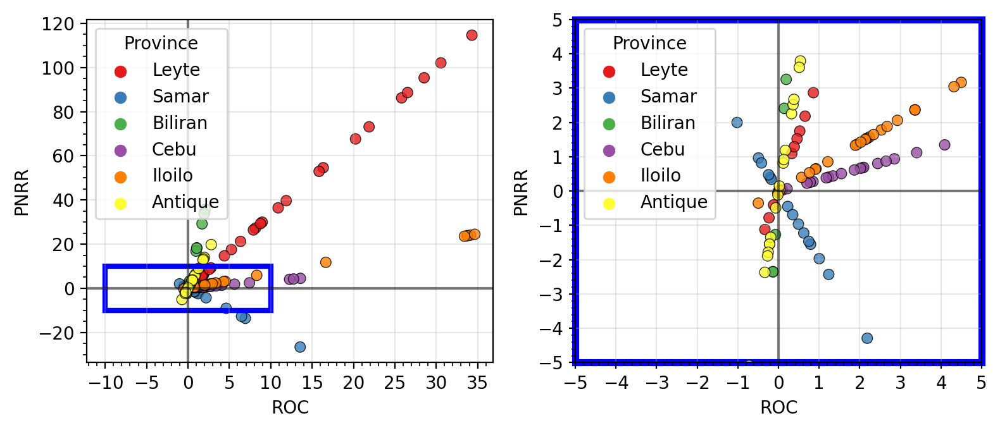

In [316]:
fig, ax = plt.subplots(1,2, dpi = 200, figsize = (8,3.5))

scatter_plot_1 = sns.scatterplot(x=post_yolanda['ROC'], y=post_yolanda['PNRR'], 
                hue=post_yolanda['Province'], palette="Set1", ax = ax[0], 
                                 alpha = 0.8, ec= 'k', legend = True)

rect = patches.Rectangle((-10, -10), 20, 20, linewidth=3, edgecolor='b', facecolor='none')
ax[0].add_patch(rect)
scatter_plot_2 = sns.scatterplot(x=post_yolanda['ROC'], y=post_yolanda['PNRR'], 
                hue=post_yolanda['Province'], palette="Set1", 
                                 ax = ax[1], alpha = 0.8, ec = 'k')
ax[1].set_xlim(-5,5)
ax[1].set_ylim(-5,5)
ax[1].patch.set(lw=4, ec='blue')

for ax in ax: 
    ax.grid(alpha = 0.3)
    ax.axvline(0, color = 'k', alpha = 0.5)
    ax.axhline(0, color = 'k', alpha = 0.5)
    ax.minorticks_on()
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

fig.tight_layout()
# plt.savefig(results_path + "BM_stats_summary_provinces.png", bbox_inches="tight")

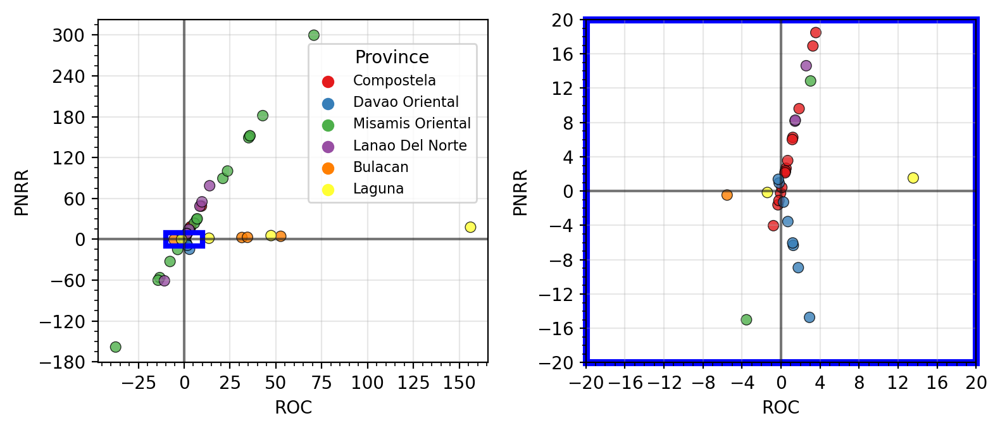

In [317]:
fig, ax = plt.subplots(1,2, dpi = 200, figsize = (8,3.5))

scatter_plot_1 = sns.scatterplot(x=post_others['ROC'], y=post_others['PNRR'], 
                hue=post_others['Province'], palette="Set1", ax = ax[0], 
                                 alpha = 0.8, ec= 'k')
legend_1 = ax[0].legend(loc='upper left', bbox_to_anchor=(0.52, 0.95), title = 'Province',
                        fontsize=8)

rect = patches.Rectangle((-10, -10), 20, 20, linewidth=3, edgecolor='b', facecolor='none')
ax[0].add_patch(rect)
scatter_plot_2 = sns.scatterplot(x=post_others['ROC'], y=post_others['PNRR'], 
                hue=post_others['Province'], palette="Set1", legend = False,
                                 ax = ax[1], alpha = 0.8, ec = 'k')
ax[1].set_xlim(-20,20)
ax[1].set_ylim(-20,20)
ax[1].patch.set(lw=4, ec='blue')

for ax in ax: 
    ax.grid(alpha = 0.3)
    ax.axvline(0, color = 'k', alpha = 0.5)
    ax.axhline(0, color = 'k', alpha = 0.5)
    ax.minorticks_on()
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

fig.tight_layout()
# plt.savefig(results_path + "BM_stats_summary_provinces.png", bbox_inches="tight")

## sorted()

In [76]:
# # Convert 'Province' column to Categorical with the desired order
# stats_summary_final['Province'] = pd.Categorical(stats_summary_final['Province'], categories=sequence, ordered=True)

# # Sort the DataFrame based on the 'Province' column
# sorted_stats_summary = stats_summary_final.sort_values(by='Province')
# sorted_stats_summary

NameError: name 'sorted_stats_summary' is not defined

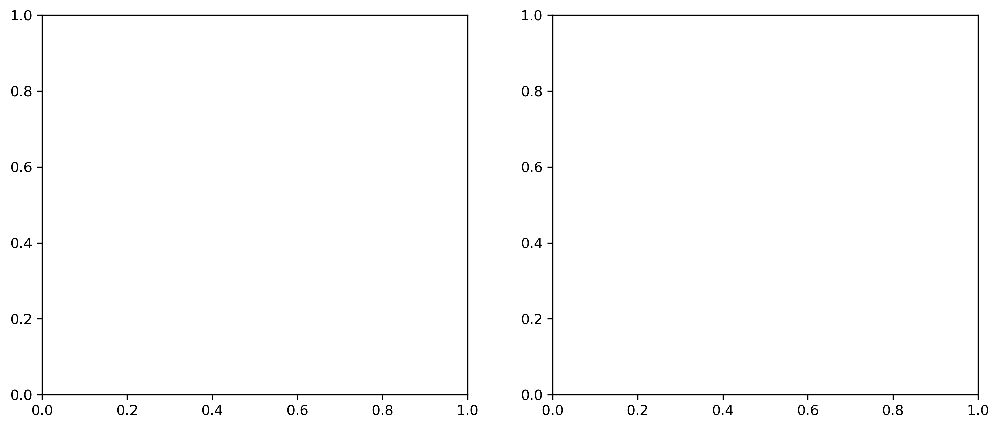

In [77]:
fig, ax = plt.subplots(1,2, dpi = 300, figsize = (12,5))


# scatter_plot_1 = sns.scatterplot(x=ROC, y=PNRR, size = r_2, hue=prov,
#             sizes=(10, 100), palette="Set1", ax = ax[0], alpha = 0.8, legend = False)

# rect = patches.Rectangle((-10, -10), 20, 20, linewidth=3, edgecolor='b', facecolor='none')
# ax[0].add_patch(rect)
# scatter_plot_2 = sns.scatterplot(x=ROC, y=PNRR, size = r_2, hue=prov,
#             sizes=(10, 200), palette="Set1", ax = ax[1], alpha = 0.5)

scatter_plot_1 = sns.scatterplot(x=sorted_stats_summary['ROC'], y=sorted_stats_summary['PNRR'], 
                hue=sorted_stats_summary['Province'], palette="Spectral", ax = ax[0], alpha = 0.8, legend = False, ec= 'k')

rect = patches.Rectangle((-10, -10), 20, 20, linewidth=3, edgecolor='b', facecolor='none')
ax[0].add_patch(rect)
scatter_plot_2 = sns.scatterplot(x=ROC, y=PNRR, hue=prov,
            palette="Spectral", ax = ax[1], alpha = 0.8, ec = 'k')
ax[1].set_xlim(-10,10)
ax[1].set_ylim(-10,10)
ax[1].patch.set(lw=4, ec='blue')


# Create a legend for the second subplot
legend_2 = ax[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=12)

for ax in ax: 
    ax.grid(alpha = 0.3)
    ax.axvline(0, color = 'k', alpha = 0.5)
    ax.axhline(0, color = 'k', alpha = 0.5)
    ax.minorticks_on()
#     ax.xaxis.grid(True, which='minor', alpha = 0.2) 
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))


fig.supylabel('Provincial NTL Rise Ratio (PNRR)', fontsize = 12)
fig.supxlabel('Rate of Change (ROC), $nW ·cm^{−2}·sr^{−1}$',  fontsize = 12)
fig.tight_layout()
plt.savefig(results_path + "BM_stats_summary_provinces.png", bbox_inches="tight")

## Other Plots

In [ ]:
fig, ax = plt.subplots(dpi = 200, figsize = (12,6))#, sharey = True)

ax.grid(alpha = 0.3)

sns.scatterplot(x=sorted_stats_summary['ROC'], y=sorted_stats_summary['Province'], 
                                 size = sorted_stats_summary['r$^2$'], hue=sorted_stats_summary['Typhoon'],
            sizes=(10, 200), palette="Set1", ax = ax, alpha = 0.8, )

In [ ]:
fig, ax = plt.subplots(dpi = 200, figsize = (12,6))#, sharey = True)

ax.grid(alpha = 0.3)

sns.scatterplot(x=sorted_stats_summary['PNRR'], y=sorted_stats_summary['Province'], 
                                 size = sorted_stats_summary['r$^2$'], hue=sorted_stats_summary['Typhoon'],
            sizes=(10, 200), palette="Set1", ax = ax, alpha = 0.8, )

In [ ]:
fig, ax = plt.subplots(dpi = 100, figsize = (10,5))#, sharey = True)

ax.grid(alpha = 0.3)
sns.stripplot(x= sorted_stats_summary['ROC'], y=sorted_stats_summary['Province'], orient = 'h',
            palette="Set1", ax = ax, hue=sorted_stats_summary['Typhoon'])
# sns.boxplot(x=sorted_stats_summary['ROC'], y=sorted_stats_summary['Province'], 
#             hue=sorted_stats_summary['Typhoon'], orient = 'h',
#             palette="Set1", ax = ax)

In [ ]:
fig, ax = plt.subplots(dpi = 200, figsize = (12,6))#, sharey = True)

ax.grid(alpha = 0.3)
scatter_plot_1 = sns.scatterplot(x=PNRR, y=prov, size = r_2, hue=typh, 
            sizes=(10, 200), palette="Set1", ax = ax, alpha = 0.8)

# Create a legend for the second subplot
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=11)
# plt.yscale('log')

plt.xlabel('Provincial NTL Rise Ratio (PNRR)', fontsize = 12)
fig.tight_layout()
plt.savefig(path + "BM_stats_summary_typhoon.png", bbox_inches="tight")

# Aggregating Provincially

In [ ]:
# summary_provinces = stats_summary_final.groupby('Province')['ROC'].agg(['mean', 'std']).reset_index()
# summary_provinces = summary_provinces.rename(columns={'mean': 'ROC Mean', 'std': 'ROC STD'})

# summary_provinces = summary_provinces.merge(stats_summary_final.groupby('Province')['PNRR'].agg(['mean', 'std']).reset_index(),
#                                             on='Province', how='left')

# summary_provinces = summary_provinces.rename(columns={'mean': 'PNRR Mean', 'std': 'PNRR STD'})
# # summary_provinces.set_index('Province',drop = 'True', inplace = True)

# # summary_provinces['PNRR Mean','PNRR STD'] = summary_PNRR['mean', 'std']
# summary_provinces

# # summary_provinces.set_index('Province')
# # summary_provinces = stats_summary_final.groupby(['Province','ROC']).size().reset_index().pivot(columns='ROC', index='Province', values=0)
# # summary_provinces

In [ ]:
# # Grouping by Province and calculating mean and std for ROC
# roc_summary = stats_summary_final.groupby('Province')['ROC'].agg(['mean', 'std']).reset_index()
# roc_summary = roc_summary.rename(columns={'mean': 'ROC Mean', 'std': 'ROC STD'})

# # Grouping by Province and calculating mean and std for PNRR
# pnrr_summary = stats_summary_final.groupby('Province')['PNRR'].agg(['mean', 'std', 'count']).reset_index()
# pnrr_summary = pnrr_summary.rename(columns={'mean': 'PNRR Mean', 'std': 'PNRR STD', 'count': 'Sites'})

# # Merging the two summaries on 'Province'
# summary_provinces = pd.merge(roc_summary, pnrr_summary, on='Province', how='left')
# summary_provinces = summary_provinces.sort_values(by='Sites', ascending=False)

# # Displaying the result
# summary_provinces

In [410]:
# Merging the two dataframes on 'Province'
stats_provinces = stats_summary_prov[['ROC', 'STD']]
stats_provinces = stats_provinces.rename(columns={'ROC': 'Provincial ROC', 'STD': 'Provincial STD'})
stats_provinces['Province'] = stats_provinces.index
stats_provinces

,Provincial ROC,Provincial STD,Province
Leyte,0.299207,0.023442,Leyte
Iloilo,1.417769,0.028539,Iloilo
Antique,0.141972,0.020391,Antique
Cebu,3.030277,0.049877,Cebu
Samar,-0.509114,0.020247,Samar
Compostela,0.193026,0.018865,Compostela
Misamis Oriental,0.236012,0.027485,Misamis Oriental
Negros Occidental,0.705803,0.024163,Negros Occidental
Albay,1.29432,0.026338,Albay
Aklan,0.53548,0.02444,Aklan


In [411]:
import pandas as pd

# Assuming your DataFrame is named 'stats_summary_final'
# stats_summary_final = ...

# Grouping by Province and calculating mean and std for ROC
roc_summary = stats_summary_final.groupby('Province')['ROC'].agg(['mean', 'std']).reset_index()
roc_summary = roc_summary.rename(columns={'mean': 'ROC Mean', 'std': 'ROC STD'})

# Grouping by Province and calculating mean, std, and count for PNRR
pnrr_summary = stats_summary_final.groupby('Province')['PNRR'].agg(['mean', 'std', 'count']).reset_index()
pnrr_summary = pnrr_summary.rename(columns={'mean': 'PNRR Mean', 'std': 'PNRR STD', 'count': 'Sites'})

# Adding a new column 'Most Common Typhoon' with the most common typhoon for each province
most_common_typhoon = stats_summary_final.groupby('Province')['Typhoon'].agg(lambda x: x.value_counts().idxmax()).reset_index()
most_common_typhoon = most_common_typhoon.rename(columns={'Typhoon': 'Calamity'})


# # Merging the two summaries on 'Province'
summary_resettlement = pd.merge(roc_summary, pnrr_summary, on='Province', how='left')

summary_provinces = pd.merge(stats_provinces,summary_resettlement, on='Province', how='left')
# Merging the most common typhoon information
summary_provinces = pd.merge(summary_provinces, most_common_typhoon, on='Province', how='left')

# Sorting by 'Sites' in descending order
summary_provinces = summary_provinces.sort_values(by='Sites', ascending=False)

bins = [0, 10, 20, float('inf')]
labels = ['Fewer than 10 Sites', '10 to 20 Sites', 'More than 20 Sites']
summary_provinces['Number of Sites'] = pd.cut(summary_provinces['Sites'], bins=bins, labels=labels, right=True)

summary_provinces['Angle'] = 180*np.arctan(summary_provinces['PNRR Mean']/summary_provinces['ROC Mean'])/np.pi
summary_provinces['Province_'] = summary_provinces['Province'] 

summary_provinces = summary_provinces.set_index('Province_')

summary_provinces = summary_provinces.reindex(order)
summary_provinces

,Provincial ROC,Provincial STD,Province,ROC Mean,ROC STD,PNRR Mean,PNRR STD,Sites,Calamity,Number of Sites,Angle
Province_,,,,,,,,,,,
Leyte,0.299207,0.023442,Leyte,8.234144,10.131670,27.519848,33.861687,38,Yolanda,More than 20 Sites,73.342424
Samar,-0.509114,0.020247,Samar,1.929666,3.613796,-3.790241,7.098202,19,Yolanda,10 to 20 Sites,-63.018708
Biliran,0.05813,0.0183,Biliran,0.802231,0.854269,13.800548,14.695751,11,Yolanda,10 to 20 Sites,86.673119
Cebu,3.030277,0.049877,Cebu,3.610960,4.041028,1.191627,1.333551,23,Yolanda,More than 20 Sites,18.263036
Iloilo,1.417769,0.028539,Iloilo,7.157065,11.355248,5.048118,8.009238,29,Yolanda,More than 20 Sites,35.196601
Antique,0.141972,0.020391,Antique,0.481879,0.855199,3.394188,6.023727,26,Yolanda,More than 20 Sites,81.919622
Negros Occidental,0.705803,0.024163,Negros Occidental,14.247550,17.278650,20.186304,24.480847,15,Yolanda,10 to 20 Sites,54.785449
Aklan,0.53548,0.02444,Aklan,1.380693,1.510962,2.578423,2.821699,12,Yolanda,10 to 20 Sites,61.831860
Capiz,0.707111,0.02319,Capiz,8.269681,7.204709,11.695027,10.188937,7,Yolanda,Fewer than 10 Sites,54.735453


In [412]:
palette = sns.color_palette('Paired', 12)
palette

[(0.6509803921568628, 0.807843137254902, 0.8901960784313725),
 (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 (0.6980392156862745, 0.8745098039215686, 0.5411764705882353),
 (0.2, 0.6274509803921569, 0.17254901960784313),
 (0.984313725490196, 0.6039215686274509, 0.6),
 (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 (0.9921568627450981, 0.7490196078431373, 0.43529411764705883),
 (1.0, 0.4980392156862745, 0.0),
 (0.792156862745098, 0.6980392156862745, 0.8392156862745098),
 (0.41568627450980394, 0.23921568627450981, 0.6039215686274509),
 (1.0, 1.0, 0.6),
 (0.6941176470588235, 0.34901960784313724, 0.1568627450980392)]

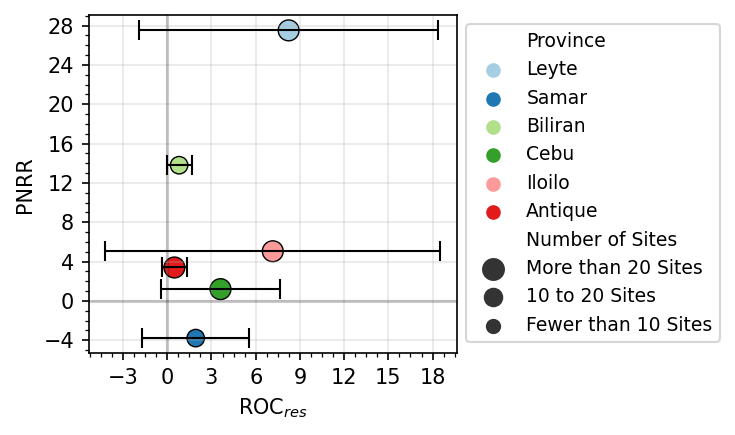

In [415]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'summary_provinces'
# summary_provinces = ...

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(5, 3), dpi = 150)
plt.grid(alpha = 0.3)

for i, province in enumerate(summary_provinces[:6]['Province']):
    x_val = summary_provinces.loc[province, 'ROC Mean']
    y_val = summary_provinces.loc[province, 'PNRR Mean']
    x_err = summary_provinces.loc[province, 'ROC STD']
    y_err = summary_provinces.loc[province, 'PNRR STD']
    
    ax.errorbar(x_val, y_val, xerr=x_err, fmt='none', 
                ecolor='black', elinewidth=1, capsize = 5)

# Scatter plot with size representing the number of sites and hue representing the calamity
scatter_plot_p = sns.scatterplot(x=summary_provinces[:6]['ROC Mean'], 
                                 y=summary_provinces[:6]['PNRR Mean'],
                                 size=summary_provinces[:6]['Number of Sites'], 
                                 hue = summary_provinces[:6]['Province'],
                                 sizes=(40, 100), ax=ax, 
                                 palette=palette[:6],
                                 ec = 'k', 
                                 size_order=labels[::-1])
ax.grid(alpha = 0.3)
ax.axvline(0, color = 'k', alpha = 0.2)
ax.axhline(0, color = 'k', alpha = 0.2)
ax.minorticks_on()
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.set_xlabel('ROC$_{res}$')
ax.set_ylabel('PNRR')

legend_1 = ax.legend(loc='upper left', bbox_to_anchor=(1, 1),
                        fontsize=9, fancybox=True)
fig.tight_layout()
plt.savefig(results_path + "Post_Yolanda_results.png", bbox_inches="tight")

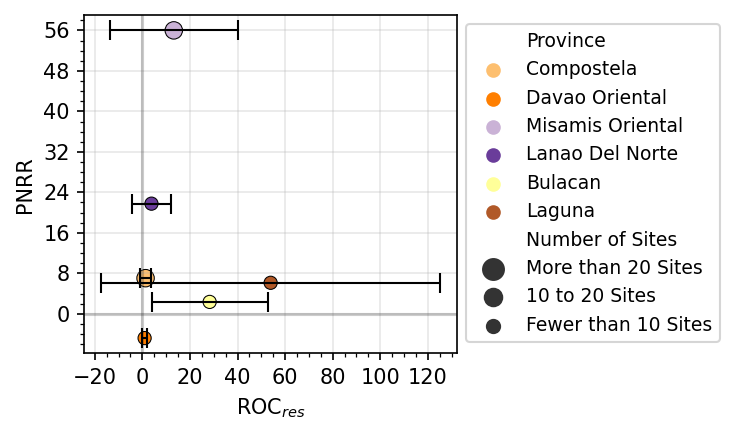

In [416]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'summary_provinces'
# summary_provinces = ...

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(5, 3), dpi = 150)
plt.grid(alpha = 0.3)

for i, province in enumerate(summary_provinces[-6:]['Province']):
    x_val = summary_provinces.loc[province, 'ROC Mean']
    y_val = summary_provinces.loc[province, 'PNRR Mean']
    x_err = summary_provinces.loc[province, 'ROC STD']
    y_err = summary_provinces.loc[province, 'PNRR STD']
    
    ax.errorbar(x_val, y_val, xerr=x_err, fmt='none', 
                ecolor='black', elinewidth=1, capsize = 5)

# Scatter plot with size representing the number of sites and hue representing the calamity
scatter_plot_p = sns.scatterplot(x=summary_provinces[-6:]['ROC Mean'], 
                                 y=summary_provinces[-6:]['PNRR Mean'],
                                 size=summary_provinces[-6:]['Number of Sites'], 
                                 hue = summary_provinces[-6:]['Province'],
                                 sizes=(40, 100), ax=ax, 
                                 palette=palette[-6:],
                                 ec = 'k', 
                                 size_order=labels[::-1])
ax.grid(alpha = 0.3)
ax.axvline(0, color = 'k', alpha = 0.2)
ax.axhline(0, color = 'k', alpha = 0.2)
ax.minorticks_on()
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
ax.set_xlabel('ROC$_{res}$')
ax.set_ylabel('PNRR')

legend_1 = ax.legend(loc='upper left', bbox_to_anchor=(1, 1),
                        fontsize=9, fancybox=True)

fig.tight_layout()
plt.savefig(results_path + "Post_Others_results.png", bbox_inches="tight")

KeyError: 'Resettlement Sites'

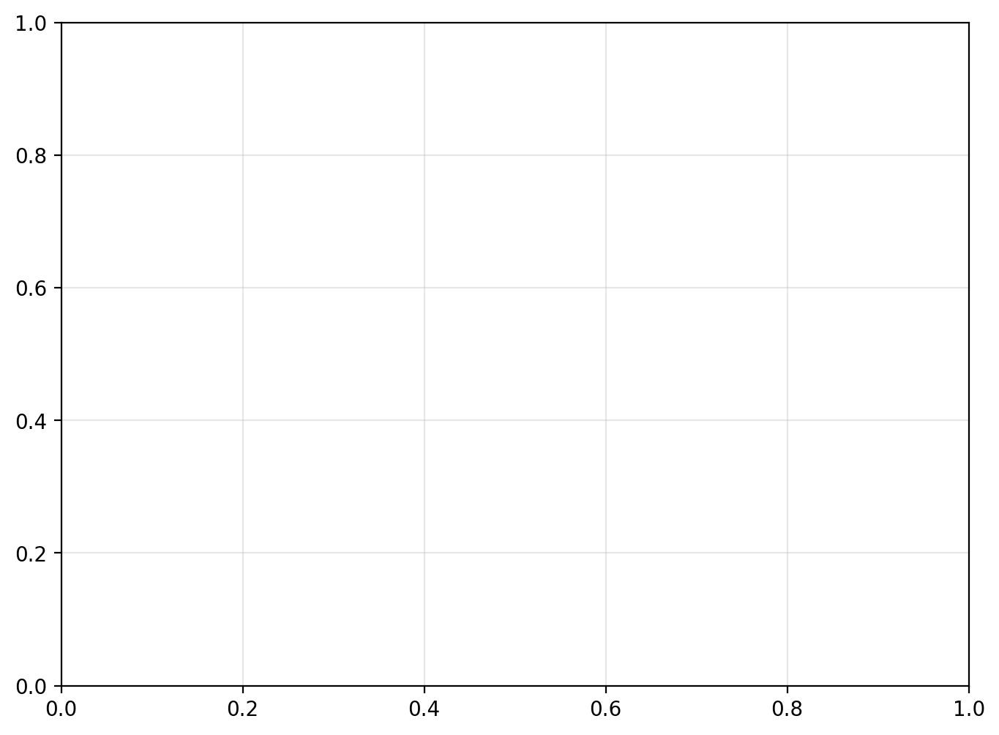

In [374]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'summary_provinces'
# summary_provinces = ...

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(8, 6), dpi = 200)
plt.grid(alpha = 0.3)

# Scatter plot with size representing the number of sites and hue representing the calamity
scatter_plot_p = sns.scatterplot(x=summary_provinces['Angle'], y=summary_provinces['PNRR Mean'],
                          size=summary_provinces['Resettlement Sites'], hue=summary_provinces['Calamity'],
                          sizes=(40, 400), ax=ax, palette="Set1", size_order=labels[::-1])

# Annotating each point with its respective province
for i in range(len(summary_provinces)):
    ax.annotate(summary_provinces['Province'].iloc[i],
            (summary_provinces['ROC Mean'].iloc[i], summary_provinces['PNRR Mean'].iloc[i] - 0.025),
            textcoords="offset points", color = 'w', fontsize = 9.1,
            xytext=(0, 5),
            ha='right')

    ax.annotate(summary_provinces['Province'].iloc[i],
                (summary_provinces['ROC Mean'].iloc[i], summary_provinces['PNRR Mean'].iloc[i] - 0.02),
                textcoords="offset points",
                xytext=(0, 5),
                ha='right')

    
scatter_plot_p.legend(loc='center left', bbox_to_anchor=(0.02, 0.85), fontsize = 12, ncol = 2)
ax.set_ylabel('Provincial NTL Rise Ratio (PNRR)', fontsize = 12)
ax.set_xlabel('Rate of Change (ROC), $nW ·cm^{−2}·sr^{−1}$',  fontsize = 12)
# ax.set_xlim(-2, 15)
# ax.set_ylim(-10, 60)


# Show the plot
plt.tight_layout()
plt.show()

In [171]:
summary_provinces.index.tolist()

['Leyte',
 'Iloilo',
 'Antique',
 'Cebu',
 'Samar',
 'Compostela',
 'Misamis Oriental',
 'Negros Occidental',
 'Albay',
 'Aklan',
 'Biliran',
 'Davao Oriental',
 'Capiz',
 'Lanao Del Norte',
 'Bulacan',
 'Laguna']

KeyError: 'Province'

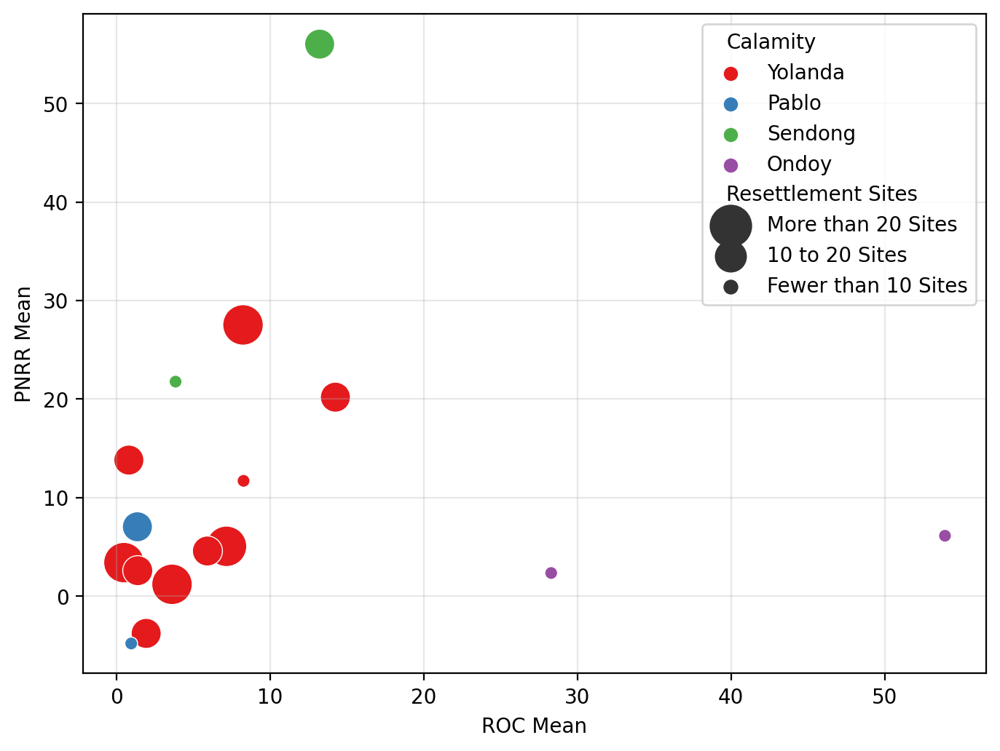

In [164]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'summary_provinces'
# summary_provinces = ...

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(8, 6), dpi = 200)
plt.grid(alpha = 0.3)

# Scatter plot with size representing the number of sites and hue representing the calamity
scatter_plot_p = sns.scatterplot(x=summary_provinces['ROC Mean'], y=summary_provinces['PNRR Mean'],
                          size=summary_provinces['Resettlement Sites'], hue=summary_provinces['Calamity'],
                          sizes=(40, 400), ax=ax, palette="Set1", size_order=labels[::-1])

# Annotating each point with its respective province
for i in range(len(summary_provinces)):
    ax.annotate(summary_provinces['Province'].iloc[i],
            (summary_provinces['ROC Mean'].iloc[i], summary_provinces['PNRR Mean'].iloc[i] - 0.025),
            textcoords="offset points", color = 'w', fontsize = 9.1,
            xytext=(0, 5),
            ha='right')

    ax.annotate(summary_provinces['Province'].iloc[i],
                (summary_provinces['ROC Mean'].iloc[i], summary_provinces['PNRR Mean'].iloc[i] - 0.02),
                textcoords="offset points",
                xytext=(0, 5),
                ha='right')

    
scatter_plot_p.legend(loc='center left', bbox_to_anchor=(0.02, 0.85), fontsize = 12, ncol = 2)
ax.set_ylabel('Provincial NTL Rise Ratio (PNRR)', fontsize = 12)
ax.set_xlabel('Rate of Change (ROC), $nW ·cm^{−2}·sr^{−1}$',  fontsize = 12)
ax.set_xlim(-2, 15)
ax.set_ylim(-10, 60)


# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'summary_provinces'
# summary_provinces = ...

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(8, 6), dpi = 200)
plt.grid(alpha = 0.3)

# Scatter plot with size representing the number of sites and hue representing the calamity
scatter_plot_p = sns.scatterplot(x=summary_provinces['ROC Mean'], y=summary_provinces['PNRR Mean'],
                          size=summary_provinces['Resettlement Sites'], hue=summary_provinces['Calamity'],
                          sizes=(40, 400), ax=ax, palette="Set1", size_order=labels[::-1])

# Annotating each point with its respective province
for i in range(len(summary_provinces)):
    ax.annotate(summary_provinces['Province'].iloc[i],
            (summary_provinces['ROC Mean'].iloc[i], summary_provinces['PNRR Mean'].iloc[i] - 0.025),
            textcoords="offset points", color = 'w', fontsize = 9.1,
            xytext=(0, 5),
            ha='right')

    ax.annotate(summary_provinces['Province'].iloc[i],
                (summary_provinces['ROC Mean'].iloc[i], summary_provinces['PNRR Mean'].iloc[i] - 0.02),
                textcoords="offset points",
                xytext=(0, 5),
                ha='right')

    
scatter_plot_p.legend(loc='center left', bbox_to_anchor=(0.02, 0.85), fontsize = 12, ncol = 2)
ax.set_ylabel('Provincial NTL Rise Ratio (PNRR)', fontsize = 12)
ax.set_xlabel('Rate of Change (ROC), $nW ·cm^{−2}·sr^{−1}$',  fontsize = 12)
ax.set_xlim(-2, 15)
ax.set_ylim(-10, 60)


# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
fig, ax = plt.subplots(dpi = 200, figsize = (8,6))

plt.grid(alpha = 0.3)

scatter_plot_p = sns.scatterplot(x=slope, y=intercept, size = r_2, hue=typh, alpha = 0.8,
            sizes=(10, 200), palette="Set1", ax = ax)
            #height=7)
# plt.yscale('log')
# plt.xscale('log')

scatter_plot_p.legend(loc='center left', bbox_to_anchor=(1.1, 0.5), fontsize = 10)
plt.savefig(path + "BM_stats_summary_typhoon.png", bbox_inches="tight")

In [ ]:
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'summary_provinces'
# summary_provinces = ...

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Scatter plot with error bars
ax.scatter(summary_provinces['ROC Mean'], summary_provinces['PNRR Mean'],
           s=100, c='blue', alpha=0.7, label='Provinces')

# Adding error bars
ax.errorbar(summary_provinces['ROC Mean'], summary_provinces['PNRR Mean'],
            xerr=summary_provinces['ROC STD'], yerr=summary_provinces['PNRR STD'],
            fmt='none', ecolor='gray', capsize=5, label='Error Bars')

# Adding labels and title
ax.set_xlabel('ROC Mean')
ax.set_ylabel('PNRR Mean')
ax.set_title('Scatter Plot of Mean ROC vs Mean PNRR by Province')

# Adding legend
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()


# Scatterplots

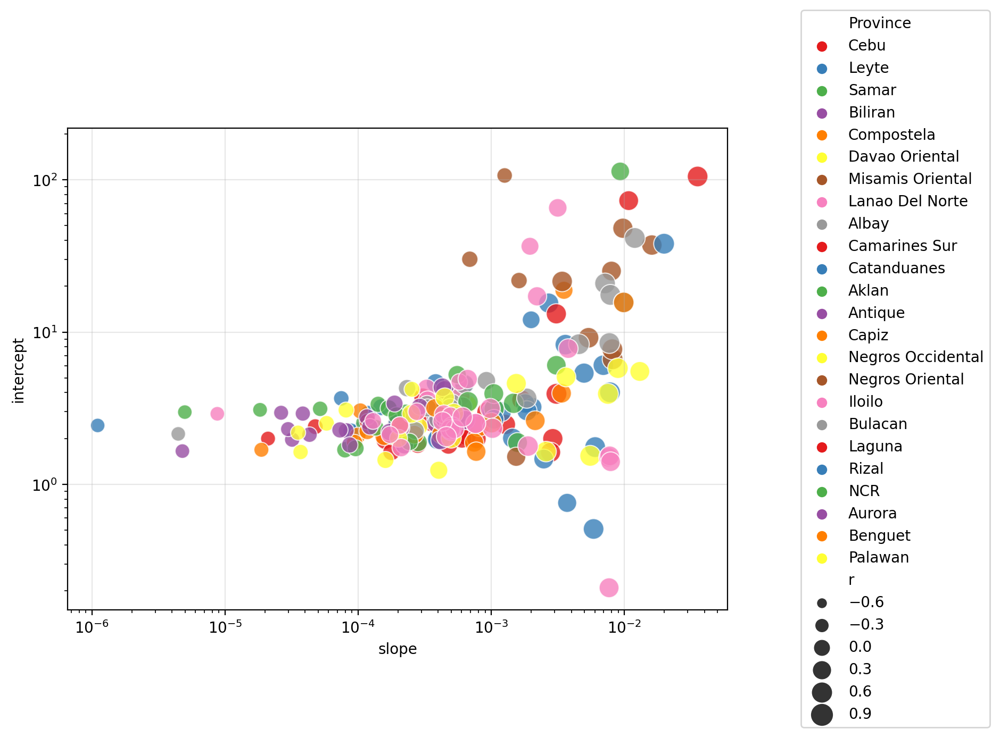

In [80]:
slope = stats_summary['slope']
intercept = stats_summary['intercept']
r = stats_summary['r']
prov = stats_summary['Province']
typh = stats_summary['Typhoon']

fig, ax = plt.subplots(dpi = 200, figsize = (8,6))

plt.grid(alpha = 0.3)

scatter_plot_p = sns.scatterplot(x=slope, y=intercept, size = r, hue=prov,
            sizes=(10, 200), palette="Set1", ax = ax, alpha = 0.8)
            #height=7)
plt.yscale('log')
plt.xscale('log')

scatter_plot_p.legend(loc='center left', bbox_to_anchor=(1.1, 0.5), fontsize = 10)
plt.savefig(path + "stats_summary_provinces.png", bbox_inches="tight")

In [ ]:
fig, ax = plt.subplots(dpi = 200, figsize = (8,6))

plt.grid(alpha = 0.3)

scatter_plot_p = sns.scatterplot(x=slope, y=intercept, size = r, hue=typh, alpha = 0.8,
            sizes=(10, 200), palette=sns.color_palette("tab10", 12), ax = ax)
            #height=7)
plt.yscale('log')
plt.xscale('log')

scatter_plot_p.legend(loc='center left', bbox_to_anchor=(1.1, 0.5), fontsize = 10)
plt.savefig(path + "stats_summary_typhoon.png", bbox_inches="tight")

# Lineplots

  0%|                                                    | 0/14 [00:00<?, ?it/s]

Province: Leyte


ValueError: too many values to unpack (expected 5)

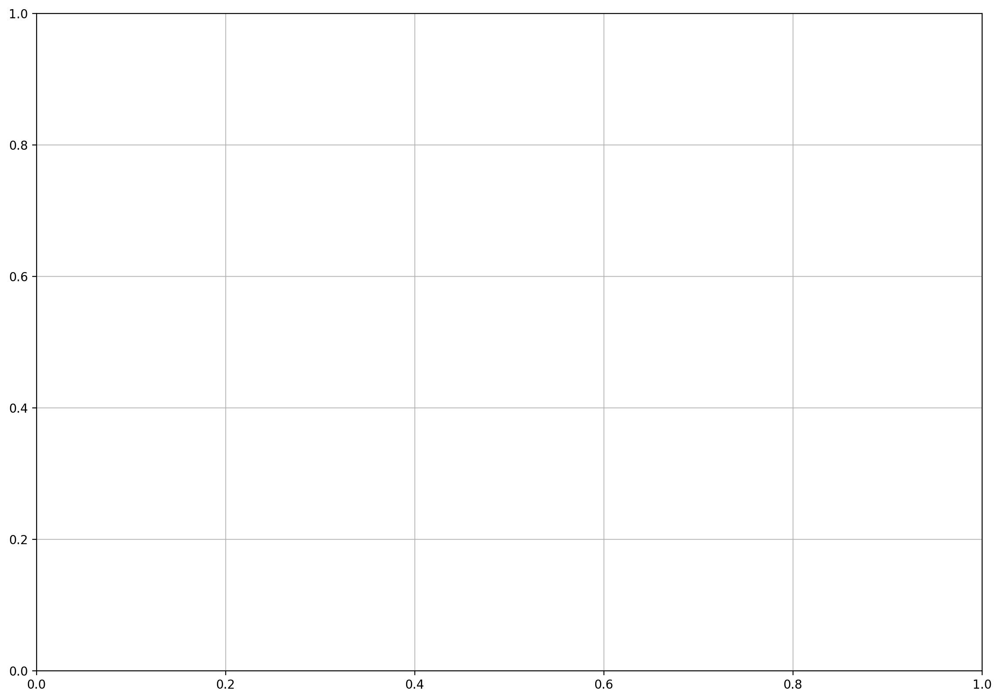

In [79]:
# fig, ax = plt.subplots(nrows=4,ncols=1, sharex='col',
#                   gridspec_kw={'height_ratios':[2,2,1.5,1.5]},
#                   figsize=(14,10), dpi = 200)


for province in tqdm(select_provinces):
    plt.figure(figsize=(14,10), dpi = 200)
    plt.grid(alpha = 0.8)
    print('Province: ' + str(province))
    sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].dropna().unique()

    for i, site in enumerate(sites):
#         print('--- Processing ' + str(site))
        
        line_color = plt.cm.Spectral(i/len(sites))
        slope, intercept, r_value, p_value, std_err = stats_summary.loc[site][:-2]    
        plt.plot(NTL_Trend.index, intercept + slope*x, color = line_color, 
                 label=str(site), alpha = 0.8, lw = 3)
        plt.legend(fontsize=10, ncol = 5, bbox_to_anchor= (0, 1.05, 1, 0.5), loc="lower left",
            bbox_transform=plt.gca().transAxes, fancybox = True, mode='expand', 
            title = str(province) + ' Resettlement Sites')
        
    plt.ylabel('NTL Trend, $nW ·cm^{−2}·sr^{−1}$')        
    dtFmt = mdates.DateFormatter('%Y') # define the formatting
    plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
    plt.show()

In [ ]:
bins, hist_vals = np.histogram(stats_summary['slope'], bins = 50)

In [ ]:
stats_summary

Province: Leyte
Province: Iloilo
Province: Antique
Province: Cebu
Province: Samar
Province: Compostela
Province: Misamis Oriental
Province: Negros Occidental
Province: Albay
Province: Aklan
Province: Biliran
Province: Davao Oriental
Province: Capiz
Province: Lanao Del Norte


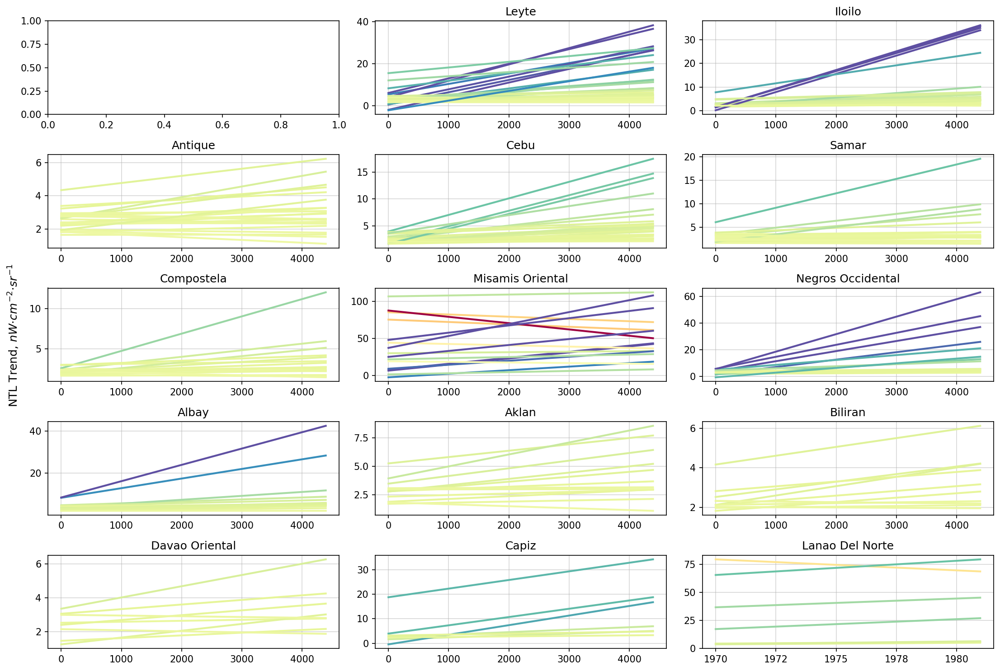

In [98]:
fig, axes = plt.subplots(nrows=5,ncols=3, figsize=(15,10), dpi = 150)


for p, ax in enumerate(axes.ravel()[1:]):
    province = select_provinces[p]
    print('Province: ' + str(province))
    sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].dropna().unique()
    x = np.linspace(0, len(dates), len(dates))

    for i, site in enumerate(sites):
#         print('--- Processing ' + str(site))
        
#         line_color = plt.cm.Spectral(i/len(sites))
        ax.grid(alpha = 0.5)
        slope, intercept, r, p, std, Province, Typhoon, ROC, STD, r_2, Prov_ROC, PNRR = stats_summary.loc[site]   
        color = (slope - stats_summary['slope'].min())/(stats_summary['slope'].max()-stats_summary['slope'].min())
        
        ax.plot(x, intercept + slope*x, color = plt.cm.Spectral(color*3), 
                 label=str(site), alpha = 1, lw = 2)
        ax.set_title(str(province))

# axes[0,0].plot(hist_vals[:-1], bins, 'ro-')
# axes[0,0].set_title('Slope Histogram')
# axes[0,0].grid(alpha = 0.5)

fig.supylabel('NTL Trend, $nW ·cm^{−2}·sr^{−1}$')        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()

In [ ]:
NTL_STL['Trend']

In [ ]:
fig, axes = plt.subplots(nrows=5,ncols=3, figsize=(15,10), dpi = 150)


for p, ax in enumerate(axes.ravel()[1:]):
    province = select_provinces[p]
    print('Province: ' + str(province))
    sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].dropna().unique()
#     x = np.linspace(0, len(dates), len(dates))
    
    line_color = plt.cm.gnuplot2(p/len(select_provinces))

    
    data = NTL_STL['Trend'][sites]
    data_mean = data.mean(axis=1)
    data_std = data.std(axis=1)
#     print(data_mean)
    ax.fill_between(data.index,data_mean+data_std, data_mean-data_std, label='STD', 
                    alpha=0.1, color=line_color)
    ax.plot(data_mean, color = line_color, lw = 2)
    ax.set_title(str(province))

    
#     for i, site in enumerate(sites):
# #         ax.plot(NTL_STL['Trend'][site], color = 'k', alpha = 0.1)
# #         print('--- Processing ' + str(site))
        
#         line_color = plt.cm.Spectral(i/len(sites))
#         ax.grid(alpha = 0.5)
# #         slope, intercept, r, p, std, Province, Typhoon, ROC, STD, r_2, Prov_ROC, PNRR = stats_summary.loc[site]   
# #         color = (slope - stats_summary['slope'].min())/(stats_summary['slope'].max()-stats_summary['slope'].min())
        
# #         ax.plot(x, intercept + slope*x, color = plt.cm.Spectral(color*3), 
# #                  label=str(site), alpha = 1, lw = 2)

# axes[0,0].plot(hist_vals[:-1], bins, 'ro-')
# axes[0,0].set_title('Slope Histogram')
# axes[0,0].grid(alpha = 0.5)

fig.supylabel('NTL Trend, $nW ·cm^{−2}·sr^{−1}$')        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()

In [ ]:
for p, ax in enumerate(axes.ravel()[1:]):
    province = select_provinces[p]
    print('Province: ' + str(province))
    sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].dropna().unique()
#     x = np.linspace(0, len(dates), len(dates))
    
    data = NTL_STL['Trend'][sites]
    data_mean = data.mean(axis=1)
    data_std = data.std(axis=1)
#     print(data_mean)
    plt.fill_between(data.index,data_mean+data_std, data_mean-data_std, label='STD', alpha=0.1, color='k')
    plt.plot(data_mean, 'r')
    plt.show()

In [ ]:
data

In [ ]:
norm_spectra = normalize(data['spec_recons'])
norm_spectra_mean = norm_spectra.mean(axis=0)
norm_spectra_std = norm_spectra.std(axis=0)

In [ ]:
NTL_STL['Seasonality'][:365].plot(legend=False)
# plt.yscale('log')
plt.show()
NTL_STL['Seasonality'][365:365+365].plot(legend=False)
# plt.yscale('log')
plt.show()

In [ ]:
seasonality = NTL_STL['Seasonality'][:365]
seasonality = seasonality.resample('M').mean()
# seasonality.reset_index(inplace=True)
# seasonality['Date'] = pd.to_datetime(seasonality['index'])  # Convert the 'Date' column to datetime format
# seasonality['Date'] = seasonality['Date'].dt.to_period('M')  # Format date to display only month and year
# seasonality['Date'].rename(index=lambda x: x.strftime('%B'))
seasonality

In [ ]:
fig, axes = plt.subplots(nrows=5,ncols=3, figsize=(15,10), dpi = 150)


for p, ax in enumerate(axes.ravel()[1:]):
    province = select_provinces[p]
    print('Province: ' + str(province))
    sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].dropna().unique()

    for i, site in enumerate(sites):        
        line_color = plt.cm.gnuplot2(i/len(sites))
        ax.grid(alpha = 0.5)
        seasonal_NTL = seasonality[site]     
#         seasonal_provincial = seasonality[site]        

        ax.plot(seasonal_NTL, label=str(site), marker = 'o', lw = 1, color = line_color)
        ax.set_title(str(province))
        
        dtFmt = mdates.DateFormatter('%b') # define the formatting
        ax.xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis

# axes[0,0].plot(hist_vals[:-1], bins, 'ro-')
# axes[0,0].set_title('Slope Histogram')
# axes[0,0].grid(alpha = 0.5)

fig.supylabel('NTL Trend, $nW ·cm^{−2}·sr^{−1}$')        

plt.tight_layout()

In [ ]:
plt.figure(dpi = 200)
seasonality.plot(legend=False)

In [ ]:
import pandas as pd

# Assuming your data is in a DataFrame named 'df' with a column named 'Date'
df['Date'] = pd.to_datetime(df['Date'])  # Convert the 'Date' column to datetime format
df.set_index('Date', inplace=True)  # Set 'Date' as the index

# Group by month and calculate the mean for each month
monthly_data = df.resample('M').mean()

# If you want to keep the 'Date' column in the result, you can reset the index
monthly_data.reset_index(inplace=True)

# Display the resulting DataFrame
print(monthly_data)

In [ ]:
fig, axes = plt.subplots(nrows=5,ncols=3, figsize=(15,10), dpi = 150)


for p, ax in enumerate(axes.ravel()[1:]):
    province = select_provinces[p]
    print('Province: ' + str(province))
    sites = df_resettlement.loc[df_resettlement['Province'] == province, 'Title'].dropna().unique()

    for i, site in enumerate(sites):
#         print('--- Processing ' + str(site))
        
#         line_color = plt.cm.Spectral(i/len(sites))
        ax.grid(alpha = 0.5)
        slope, intercept, r_value, p_value, std_err = stats_summary.loc[site][:-2]   
        color = (slope - stats_summary['slope'].min())/(stats_summary['slope'].max()-stats_summary['slope'].min())
        
        ax.plot(NTL_Trend.index, intercept + slope*x, color = plt.cm.Spectral(color*3), 
                 label=str(site), alpha = 1, lw = 2)
        ax.set_title(str(province))

axes[0,0].plot(hist_vals[:-1], bins, 'ro-')
axes[0,0].set_title('Slope Histogram')
axes[0,0].grid(alpha = 0.5)

fig.supylabel('NTL Trend, $nW ·cm^{−2}·sr^{−1}$')        
dtFmt = mdates.DateFormatter('%Y') # define the formatting
plt.gca().xaxis.set_major_formatter(dtFmt) # apply the format to the desired axis
plt.tight_layout()